# Module 8: Advanced Visualization Techniques

**Objective:** Learn advanced data visualization techniques to effectively communicate complex statistical relationships and create interactive visualizations.

## Contents
1. [Setup and Dataset Overview](#setup-and-dataset-overview)
2. [Statistical Visualizations](#statistical-visualizations)
   - [Histograms](#histograms)
   - [Box Plots](#box-plots)
   - [Violin Plots](#violin-plots)
   - [Kernel Density Estimation (KDE)](#kernel-density-estimation-kde)
   - [Exercises: Statistical Visualizations](#exercises-statistical-visualizations)
3. [Introduction to Seaborn](#introduction-to-seaborn)
   - [Seaborn vs. Matplotlib](#seaborn-vs-matplotlib)
   - [Styling and Themes](#styling-and-themes)
   - [Categorical Plots](#categorical-plots)
   - [Relational Plots](#relational-plots)
   - [Exercises: Seaborn Basics](#exercises-seaborn-basics)
4. [Pair Plots and Correlation Visualization](#pair-plots-and-correlation-visualization)
   - [Pair Plots](#pair-plots)
   - [Joint Plots](#joint-plots)
   - [Facet Grids](#facet-grids)
   - [Exercises: Multivariate Visualization](#exercises-multivariate-visualization)
5. [Heatmaps for Correlation Analysis](#heatmaps-for-correlation-analysis)
   - [Creating Correlation Matrices](#creating-correlation-matrices)
   - [Basic Heatmaps](#basic-heatmaps)
   - [Clustered Heatmaps](#clustered-heatmaps)
   - [Annotated Heatmaps](#annotated-heatmaps)
   - [Exercises: Correlation Analysis](#exercises-correlation-analysis)
6. [Interactive Visualization with Plotly](#interactive-visualization-with-plotly)
   - [Introduction to Plotly Express](#introduction-to-plotly-express)
   - [Basic Interactive Plots](#basic-interactive-plots)
   - [Adding Interactivity](#adding-interactivity)
   - [Dashboards with Plotly](#dashboards-with-plotly)
   - [Exercises: Interactive Visualizations](#exercises-interactive-visualizations)
7. [Comprehensive Project](#comprehensive-project)

## Setup and Dataset Overview

Let's first import the necessary libraries and load our datasets:

In [1]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.datasets import load_iris, load_diabetes, load_wine

In [2]:
# Set default styles for matplotlib/seaborn
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('tab10')
plt.rcParams['figure.figsize'] = [10, 6]
plt.rcParams['figure.dpi'] = 100

In [3]:
# Load example datasets
# 1. Iris dataset (classification)
iris = load_iris()
iris_df = pd.DataFrame(iris.data, columns=iris.feature_names)
iris_df['species'] = [iris.target_names[i] for i in iris.target]

In [4]:
# 2. Diabetes dataset (regression)
diabetes = load_diabetes()
diabetes_df = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
diabetes_df['target'] = diabetes.target

In [5]:
# 3. Wine dataset (classification)
wine = load_wine()
wine_df = pd.DataFrame(wine.data, columns=wine.feature_names)
wine_df['class'] = [wine.target_names[i] for i in wine.target]

In [6]:
# 4. Custom e-commerce dataset
# Let's create a synthetic e-commerce dataset
np.random.seed(42)
n_samples = 1000

ecommerce_df = pd.DataFrame({
    'customer_age': np.random.normal(35, 12, n_samples).clip(18, 80).astype(int),
    'time_spent_mins': np.random.exponential(20, n_samples).astype(int),
    'pages_visited': np.random.poisson(8, n_samples),
    'purchase_amount': np.random.exponential(50, n_samples) * (1 + np.random.rand(n_samples)),
    'items_purchased': np.random.poisson(2, n_samples),
    'session_duration': np.random.normal(15, 5, n_samples).clip(1, 60).astype(int),
    'device': np.random.choice(['Mobile', 'Desktop', 'Tablet'], n_samples, p=[0.6, 0.3, 0.1]),
    'has_previous_purchase': np.random.choice([True, False], n_samples, p=[0.7, 0.3]),
    'days_since_last_visit': np.random.exponential(14, n_samples).astype(int),
    'clicked_advertisement': np.random.choice([True, False], n_samples, p=[0.2, 0.8])
})

# Add some dependencies between variables to make the data more realistic
ecommerce_df['purchase_amount'] = np.where(
    ecommerce_df['has_previous_purchase'],
    ecommerce_df['purchase_amount'] * 1.3,
    ecommerce_df['purchase_amount']
)

ecommerce_df['conversion'] = (
    (ecommerce_df['time_spent_mins'] > 10) & 
    (ecommerce_df['purchase_amount'] > 0)
).astype(int)

In [7]:
# Display basic information about the datasets
print("Iris Dataset (Classification) Shape:", iris_df.shape)
print("Diabetes Dataset (Regression) Shape:", diabetes_df.shape)
print("Wine Dataset (Classification) Shape:", wine_df.shape)
print("E-commerce Dataset Shape:", ecommerce_df.shape)

Iris Dataset (Classification) Shape: (150, 5)
Diabetes Dataset (Regression) Shape: (442, 11)
Wine Dataset (Classification) Shape: (178, 14)
E-commerce Dataset Shape: (1000, 11)


In [8]:
# Show the first few rows of the e-commerce dataset
print("\nE-commerce Dataset Preview:")
ecommerce_df.head()


E-commerce Dataset Preview:


,customer_age,time_spent_mins,pages_visited,purchase_amount,items_purchased,session_duration,device,has_previous_purchase,days_since_last_visit,clicked_advertisement,conversion
0,40,3,3,2.207462,1,16,Mobile,True,7,False,0
1,33,2,8,38.788755,1,16,Tablet,True,7,False,0
2,42,20,9,16.040570,2,8,Mobile,True,7,True,1
3,53,24,8,121.548282,2,9,Desktop,True,1,False,1
4,32,0,4,107.759426,2,11,Mobile,False,51,True,0


In this module, we'll work with several datasets to learn advanced visualization techniques:
- **Iris dataset**: A classic dataset for classification containing measurements of iris flowers
- **Diabetes dataset**: A regression dataset for predicting diabetes progression
- **Wine dataset**: A dataset for classifying wine types based on chemical attributes
- **E-commerce dataset**: A synthetic dataset with customer behavior and purchase information

Each dataset has different characteristics, making them suitable for various visualization techniques.

## Statistical Visualizations

Statistical visualizations help us understand data distributions, identify patterns, and compare groups.

### Histograms

Histograms display the distribution of a single variable by dividing it into bins and showing the count or density of observations in each bin:

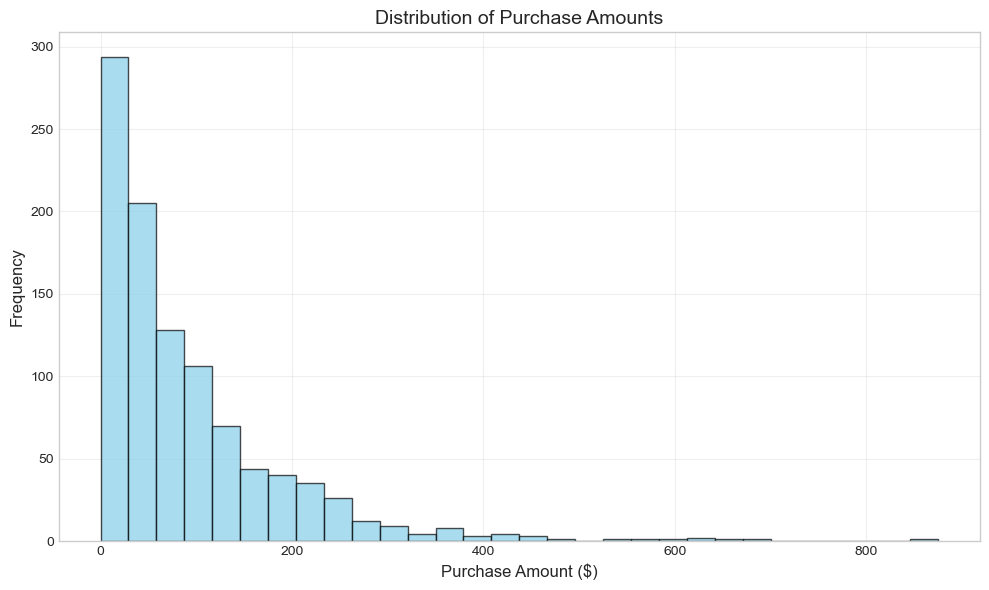

In [9]:
# Basic histogram example
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(ecommerce_df['purchase_amount'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
ax.set_title('Distribution of Purchase Amounts', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

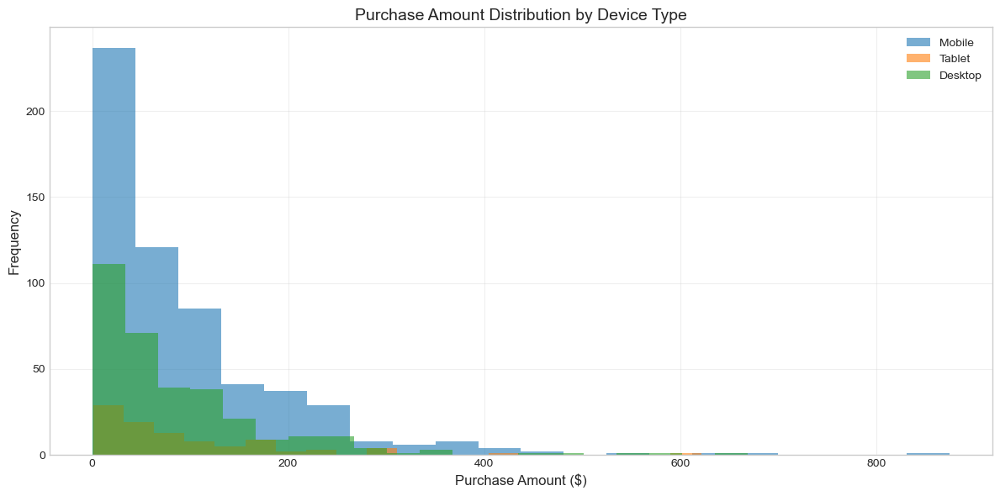

In [10]:
# Multiple histograms for comparison
fig, ax = plt.subplots(figsize=(12, 6))

# Segment by device type
devices = ecommerce_df['device'].unique()
for device in devices:
    subset = ecommerce_df[ecommerce_df['device'] == device]['purchase_amount']
    ax.hist(subset, bins=20, alpha=0.6, label=device)

ax.set_title('Purchase Amount Distribution by Device Type', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

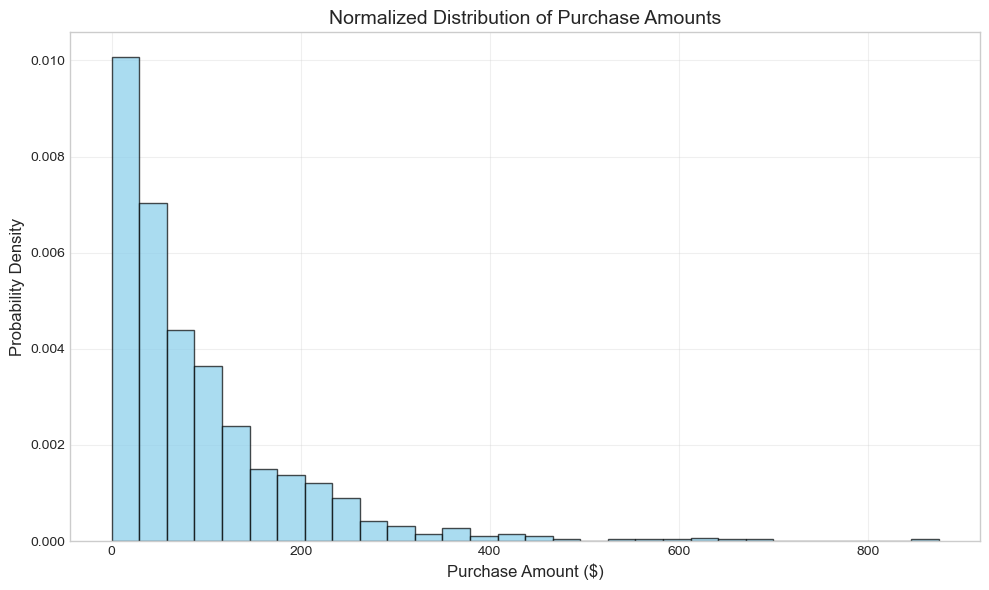

In [11]:
# Normalized histogram (probability density)
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(ecommerce_df['purchase_amount'], bins=30, density=True, 
        color='skyblue', edgecolor='black', alpha=0.7)
ax.set_title('Normalized Distribution of Purchase Amounts', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Probability Density', fontsize=12)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

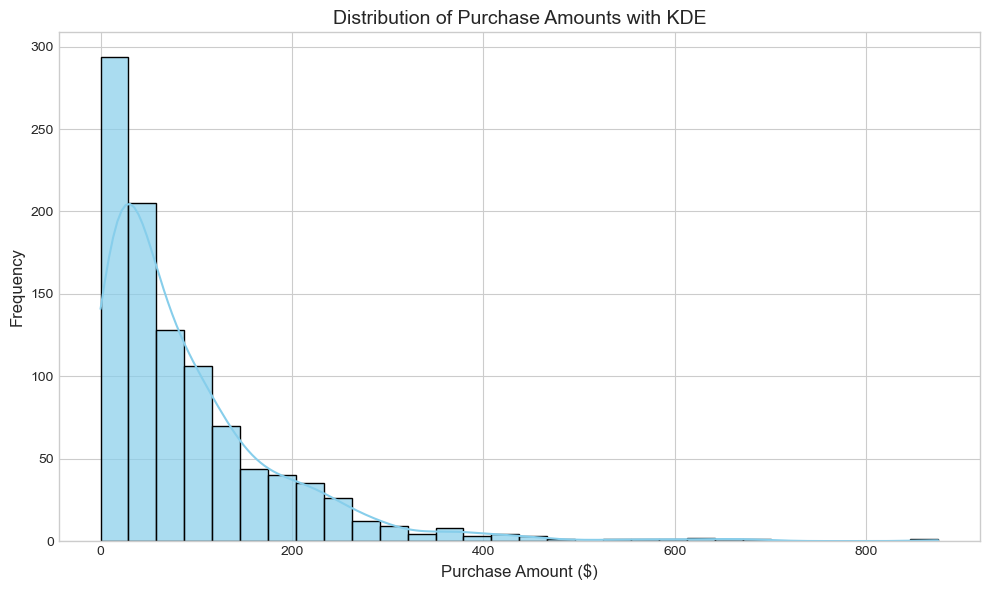

In [12]:
# Histogram with KDE overlay
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(ecommerce_df['purchase_amount'], bins=30, kde=True, 
             color='skyblue', edgecolor='black', alpha=0.7, ax=ax)
ax.set_title('Distribution of Purchase Amounts with KDE', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

Histograms are useful for:
- Visualizing the shape of data distribution (normal, skewed, bimodal, etc.)
- Identifying outliers and unusual patterns
- Comparing distributions across different groups

### Box Plots

Box plots (also called box-and-whisker plots) display the five-number summary of a dataset: minimum, first quartile (Q1), median, third quartile (Q3), and maximum:

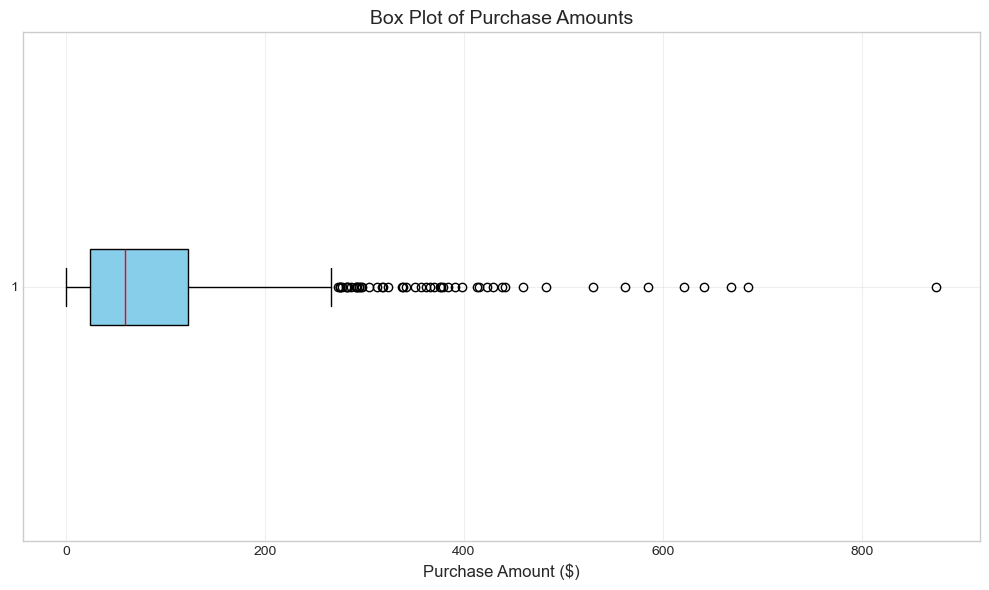

In [13]:
# Basic box plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(ecommerce_df['purchase_amount'], vert=False, patch_artist=True, 
           boxprops=dict(facecolor='skyblue', color='black'),
           medianprops=dict(color='red'))
ax.set_title('Box Plot of Purchase Amounts', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

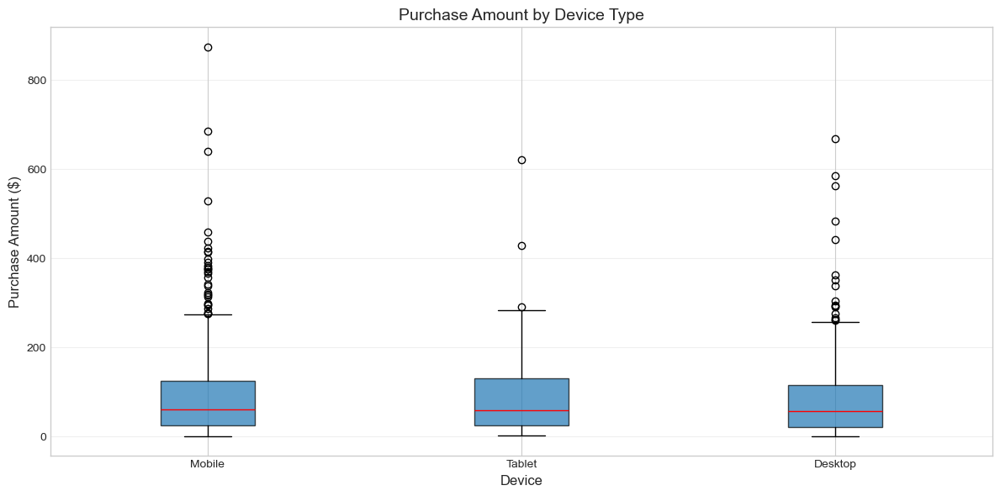

In [14]:
# Multiple box plots for comparison
fig, ax = plt.subplots(figsize=(12, 6))
data = [ecommerce_df[ecommerce_df['device'] == device]['purchase_amount'] for device in devices]
ax.boxplot(data, tick_labels=devices, patch_artist=True, 
           boxprops=dict(alpha=0.7), medianprops=dict(color='red'))
ax.set_title('Purchase Amount by Device Type', fontsize=14)
ax.set_xlabel('Device', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
ax.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

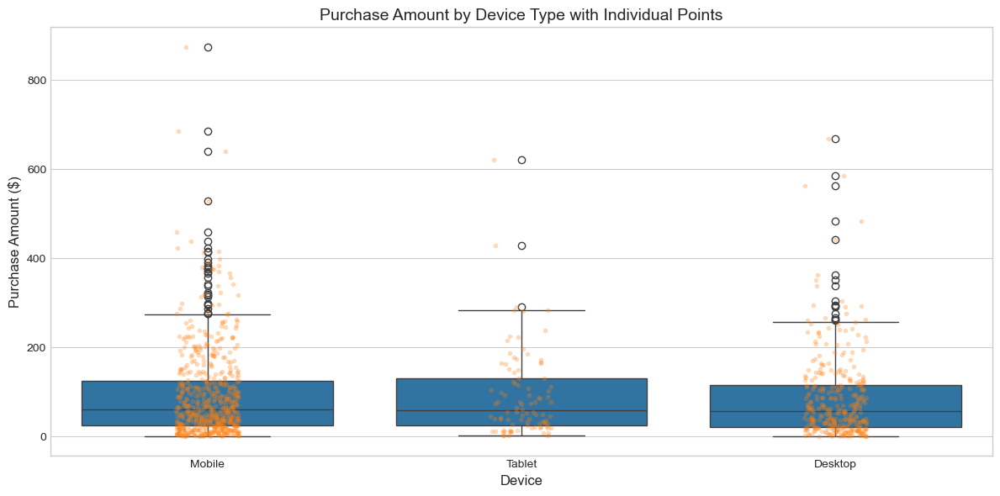

In [15]:
# Box plots with individual points
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(x='device', y='purchase_amount', data=ecommerce_df, ax=ax)
sns.stripplot(x='device', y='purchase_amount', data=ecommerce_df, 
              size=4, jitter=True, alpha=0.3, ax=ax)
ax.set_title('Purchase Amount by Device Type with Individual Points', fontsize=14)
ax.set_xlabel('Device', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

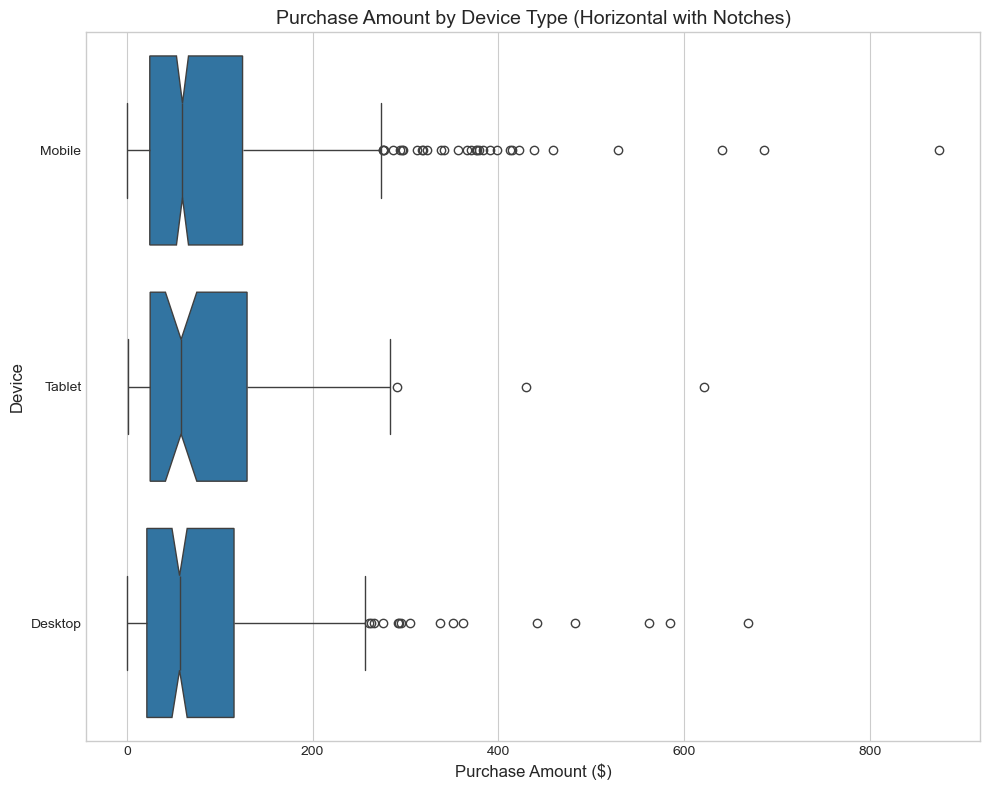

In [16]:
# Horizontal box plots with notches
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(y='device', x='purchase_amount', data=ecommerce_df, 
            notch=True, orient='h', ax=ax)
ax.set_title('Purchase Amount by Device Type (Horizontal with Notches)', fontsize=14)
ax.set_ylabel('Device', fontsize=12)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

Box plots are excellent for:
- Comparing distributions across multiple groups
- Identifying median, quartiles, and outliers
- Assessing the spread and skewness of data
- Detecting differences in central tendency and variability

### Violin Plots

Violin plots combine the features of box plots and KDE plots, showing both the distribution shape and summary statistics:

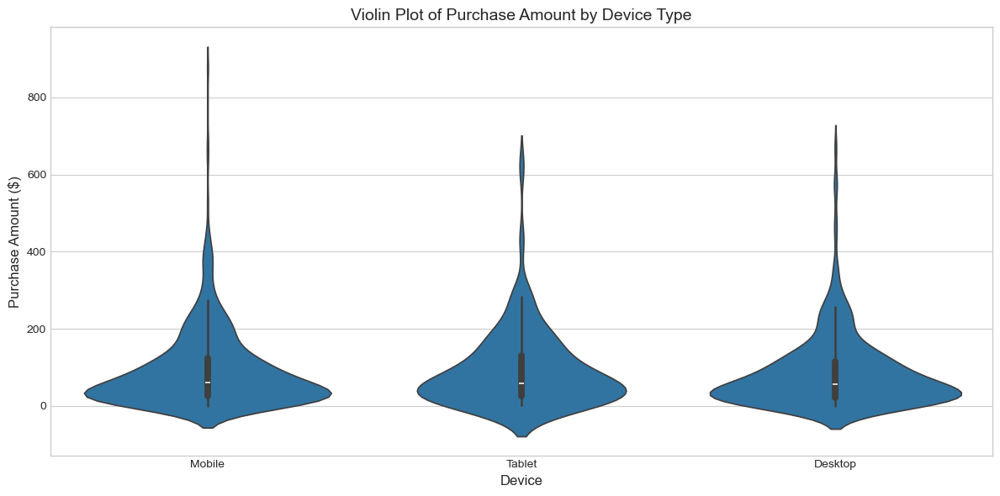

In [17]:
# Basic violin plot
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(x='device', y='purchase_amount', data=ecommerce_df, ax=ax)
ax.set_title('Violin Plot of Purchase Amount by Device Type', fontsize=14)
ax.set_xlabel('Device', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

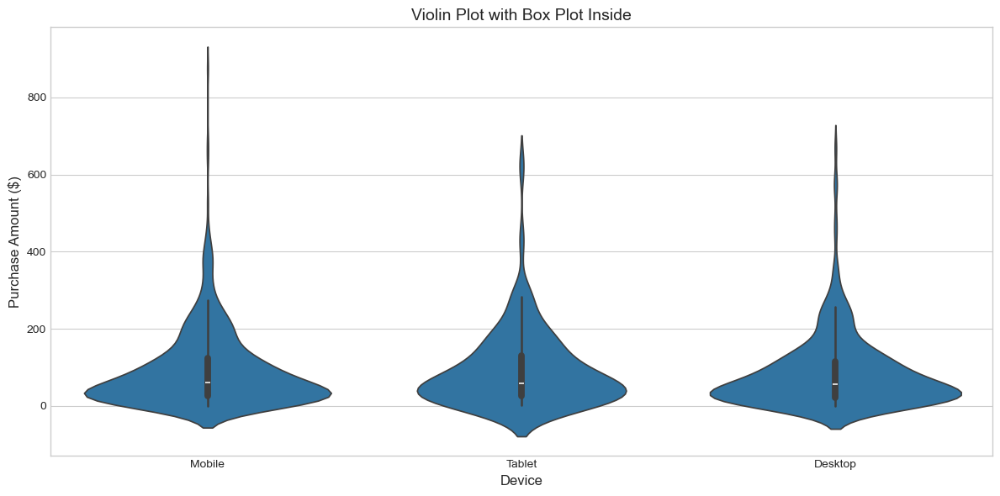

In [18]:
# Violin plot with box plot inside
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(x='device', y='purchase_amount', data=ecommerce_df, inner='box', ax=ax)
ax.set_title('Violin Plot with Box Plot Inside', fontsize=14)
ax.set_xlabel('Device', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

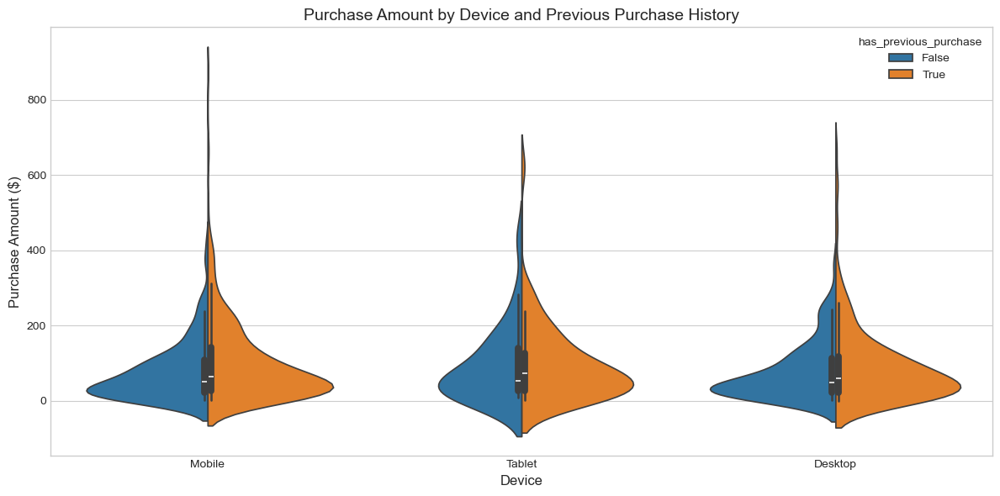

In [19]:
# Split violin plot by another categorical variable
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(x='device', y='purchase_amount', hue='has_previous_purchase',
              split=True, data=ecommerce_df, ax=ax)
ax.set_title('Purchase Amount by Device and Previous Purchase History', fontsize=14)
ax.set_xlabel('Device', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

Violin plots are valuable for:
- Showing the full distribution shape along with summary statistics
- Comparing distributions across multiple groups
- Identifying multimodal distributions
- Providing more information than box plots for complex distributions

### Kernel Density Estimation (KDE)

KDE plots provide a smooth, continuous estimate of a probability distribution:

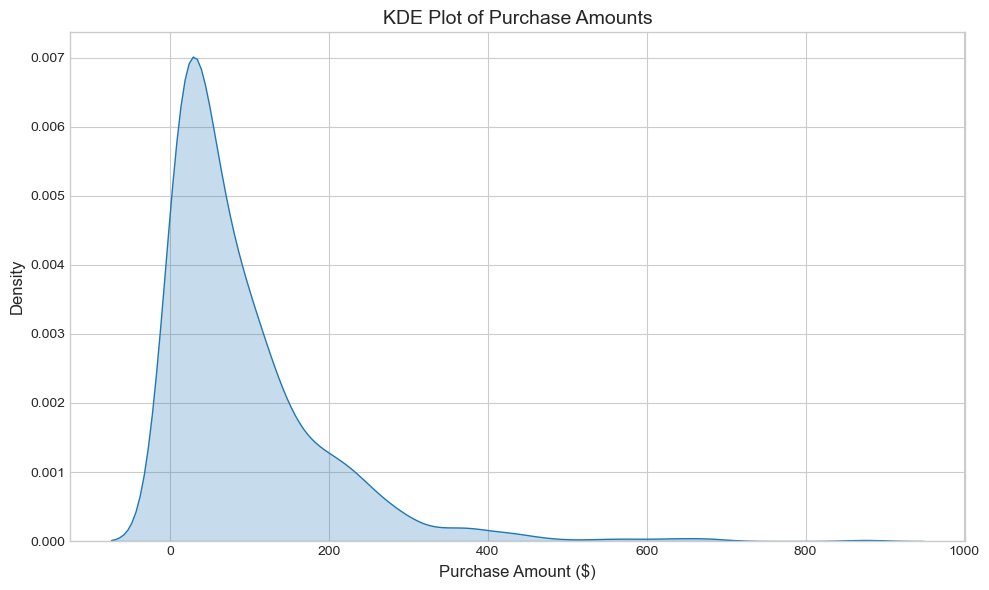

In [20]:
# Basic KDE plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.kdeplot(ecommerce_df['purchase_amount'], fill=True, ax=ax)
ax.set_title('KDE Plot of Purchase Amounts', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
plt.tight_layout()
plt.show()

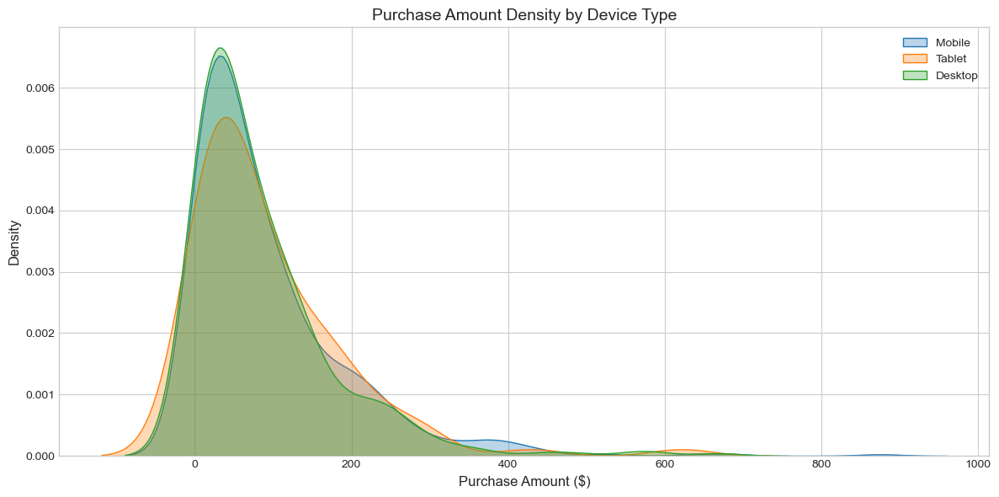

In [21]:
# Multiple KDE plots for comparison
fig, ax = plt.subplots(figsize=(12, 6))
for device in devices:
    subset = ecommerce_df[ecommerce_df['device'] == device]['purchase_amount']
    sns.kdeplot(subset, label=device, fill=True, alpha=0.3, ax=ax)
ax.set_title('Purchase Amount Density by Device Type', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.legend()
plt.tight_layout()
plt.show()

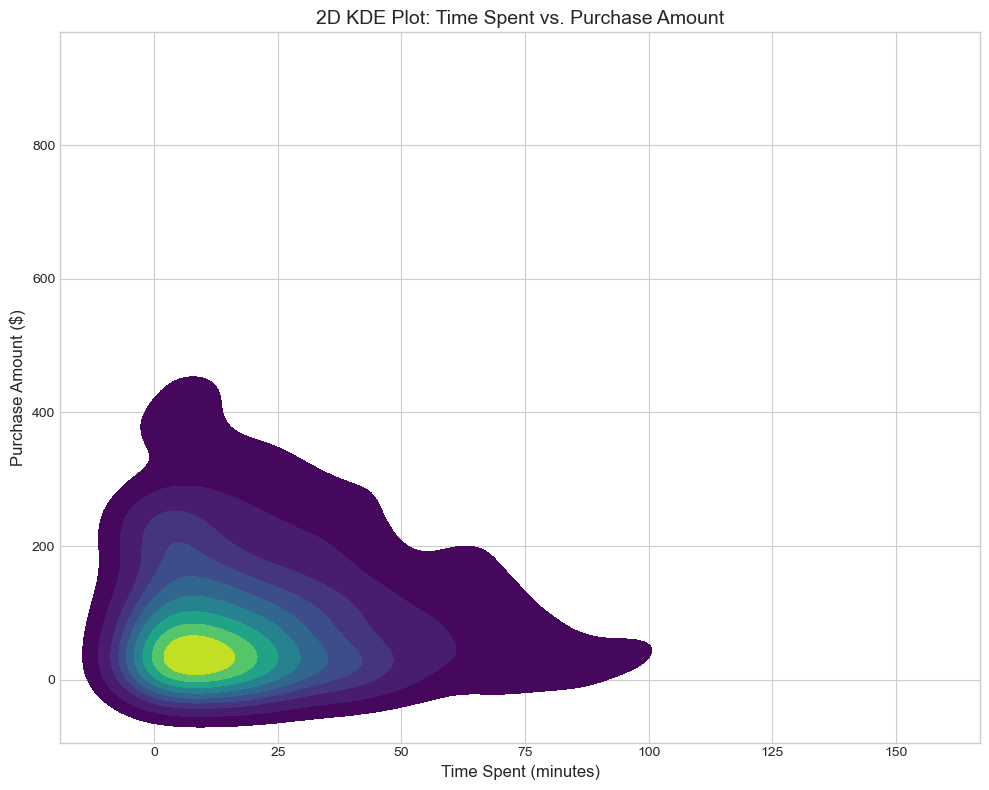

In [22]:
# 2D KDE plot
fig, ax = plt.subplots(figsize=(10, 8))
sns.kdeplot(
    x=ecommerce_df['time_spent_mins'],
    y=ecommerce_df['purchase_amount'],
    cmap="viridis",
    fill=True,
    thresh=0.05,
    ax=ax
)
ax.set_title('2D KDE Plot: Time Spent vs. Purchase Amount', fontsize=14)
ax.set_xlabel('Time Spent (minutes)', fontsize=12)
ax.set_ylabel('Purchase Amount ($)', fontsize=12)
plt.tight_layout()
plt.show()

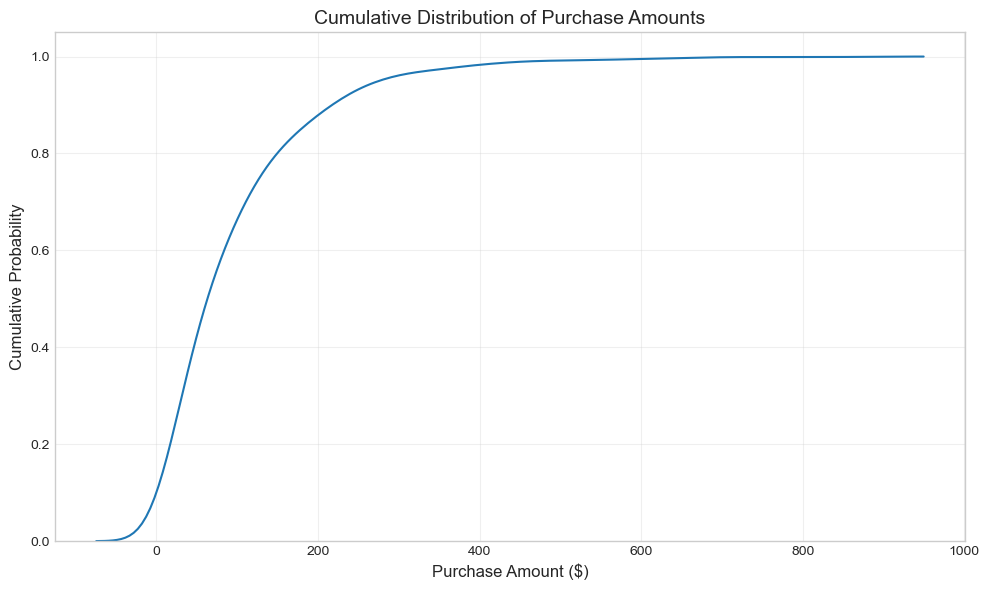

In [23]:
# Cumulative KDE
fig, ax = plt.subplots(figsize=(10, 6))
sns.kdeplot(ecommerce_df['purchase_amount'], cumulative=True, ax=ax)
ax.set_title('Cumulative Distribution of Purchase Amounts', fontsize=14)
ax.set_xlabel('Purchase Amount ($)', fontsize=12)
ax.set_ylabel('Cumulative Probability', fontsize=12)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

KDE plots are useful for:
- Visualizing continuous probability distributions
- Comparing distributions without binning (as in histograms)
- Creating smooth distribution estimates
- Examining multivariate relationships (2D KDE)

### Exercises: Statistical Visualizations

**Exercise 1**: Using the iris dataset, create histograms for each feature (sepal length, sepal width, petal length, petal width) with KDE overlays. Compare distributions across different species.

**Exercise 2**: Create a box plot of the wine dataset features, comparing the different wine classes. Identify which features show the most separation between classes.

**Exercise 3**: Generate violin plots for the e-commerce dataset, comparing time spent on the site across different device types and conversion status.

## Introduction to Seaborn

Seaborn is a statistical visualization library based on Matplotlib that provides a high-level interface for creating attractive and informative statistical graphics.

### Seaborn vs. Matplotlib

Seaborn builds on Matplotlib and integrates closely with pandas data structures:

# Comparing Matplotlib and Seaborn for the same visualization

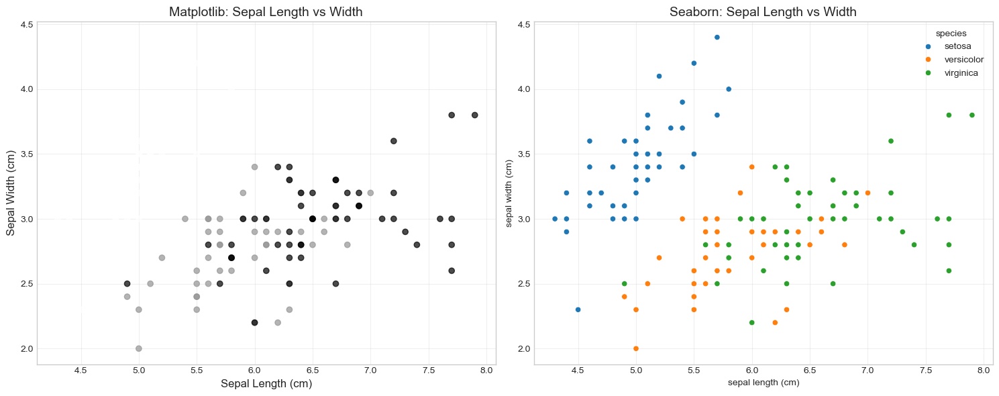

In [24]:
# Matplotlib approach
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Scatter plot with Matplotlib
ax1.scatter(iris_df['sepal length (cm)'], iris_df['sepal width (cm)'], 
           c=[{'setosa': 0, 'versicolor': 1, 'virginica': 2}[s] for s in iris_df['species']],
           alpha=0.7)
ax1.set_title('Matplotlib: Sepal Length vs Width', fontsize=14)
ax1.set_xlabel('Sepal Length (cm)', fontsize=12)
ax1.set_ylabel('Sepal Width (cm)', fontsize=12)
ax1.grid(True, alpha=0.3)

# Same scatter plot with Seaborn
sns.scatterplot(
    x='sepal length (cm)', 
    y='sepal width (cm)', 
    hue='species',
    data=iris_df,
    ax=ax2
)
ax2.set_title('Seaborn: Sepal Length vs Width', fontsize=14)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Key advantages of Seaborn over plain Matplotlib:
- Built-in support for visualizing statistical relationships
- Integrates seamlessly with pandas DataFrames
- Attractive default styles and color palettes
- High-level functions for complex visualizations
- Built-in support for categorical data visualization

### Styling and Themes

Seaborn provides several built-in themes and styling options:

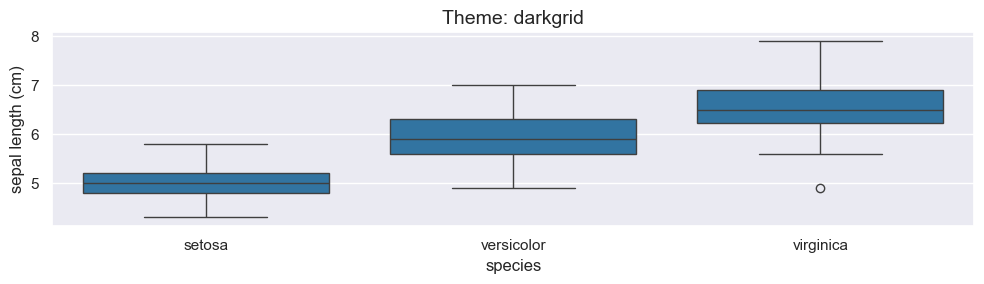

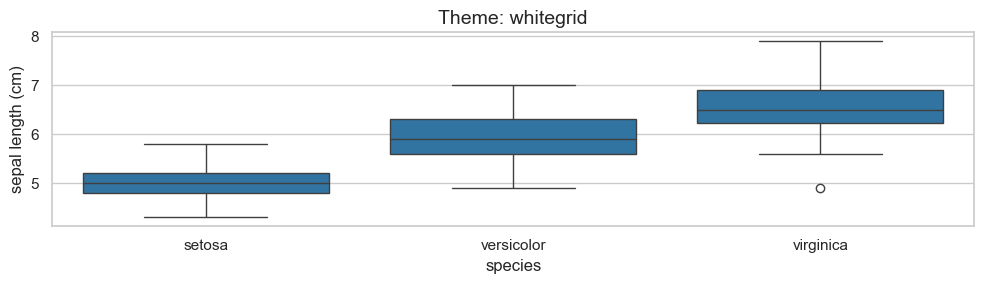

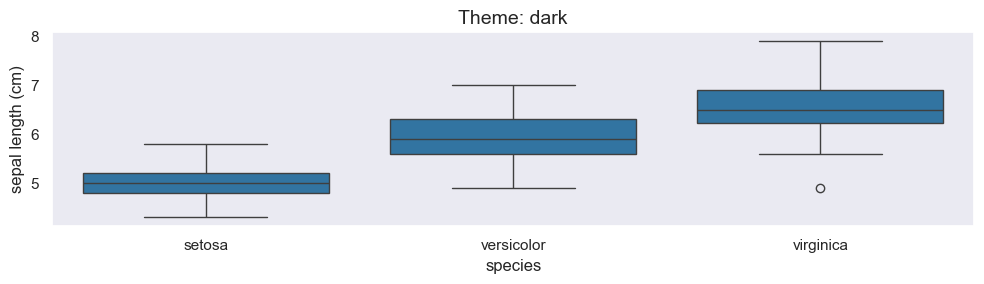

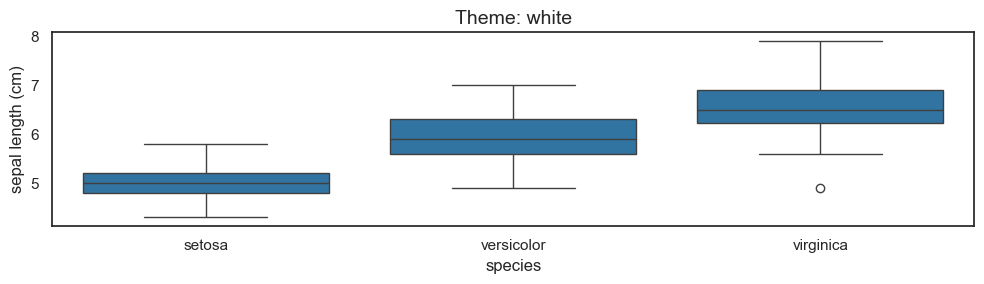

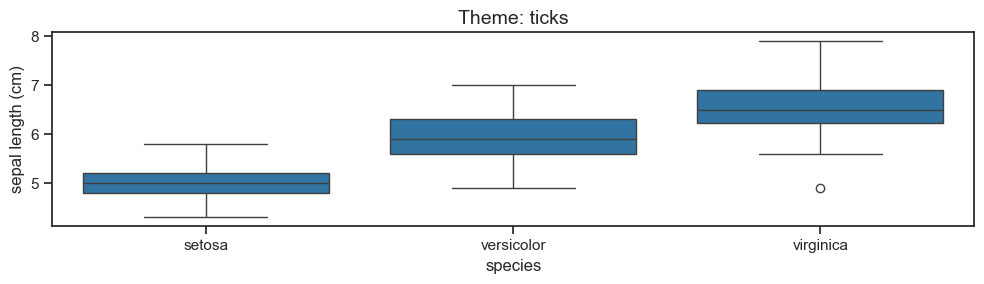

In [32]:
# Explore different Seaborn themes
themes = ['darkgrid', 'whitegrid', 'dark', 'white', 'ticks']

for theme in themes:
    # Create a new figure for each theme
    plt.figure(figsize=(10, 3))
    
    # Set the theme
    sns.set_style(theme)
    
    # Create a simple plot
    sns.boxplot(x='species', y='sepal length (cm)', data=iris_df)
    plt.title(f"Theme: {theme}", fontsize=14)
    plt.tight_layout()

plt.show()

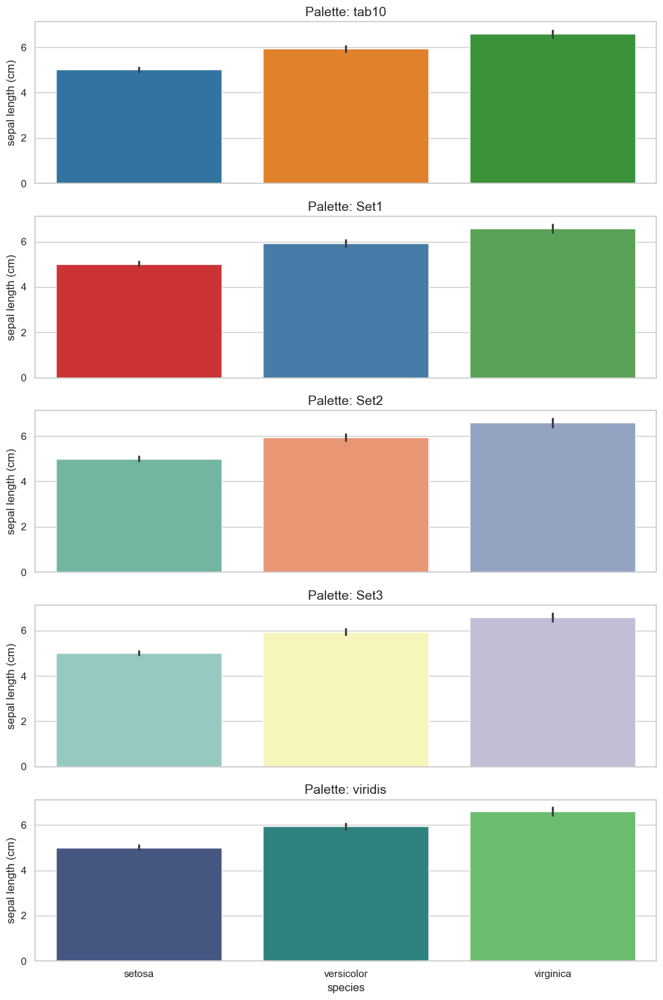

In [38]:
# Reset to default style
sns.set_style('whitegrid')

# Using color palettes
palettes = ['tab10', 'Set1', 'Set2', 'Set3', 'viridis']
fig, axes = plt.subplots(len(palettes), 1, figsize=(10, 15), sharex=True, sharey=True)

for i, palette in enumerate(palettes):
    # Create a bar plot with different color palettes - updated syntax
    sns.barplot(x='species', y='sepal length (cm)', hue='species', legend=False,
                data=iris_df, palette=palette, ax=axes[i])
    axes[i].set_title(f"Palette: {palette}", fontsize=14)

plt.tight_layout()
plt.show()

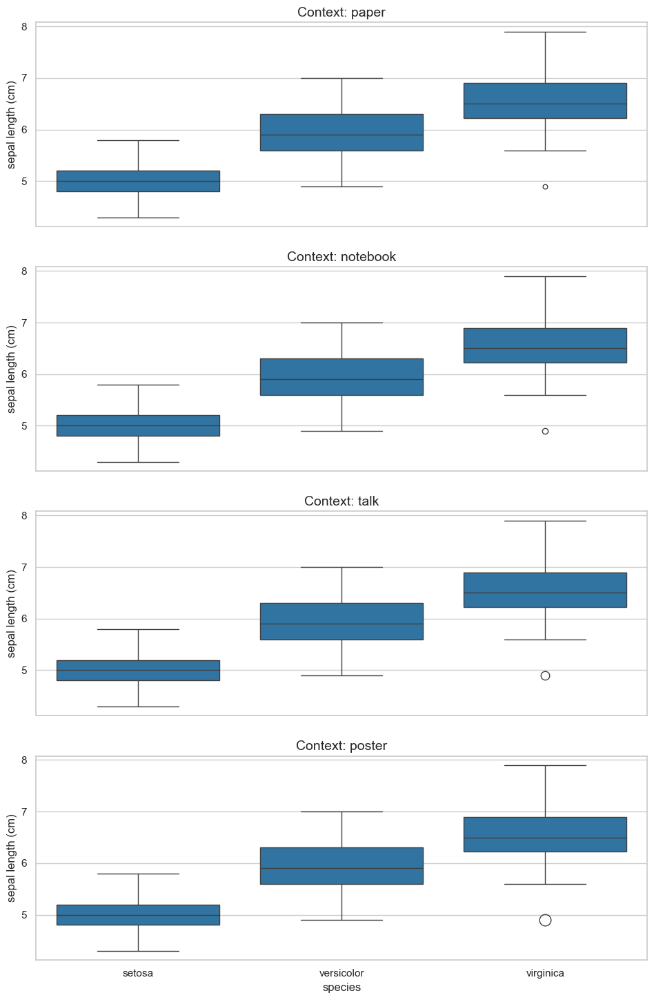

In [39]:
# Context presets for different output formats
contexts = ['paper', 'notebook', 'talk', 'poster']
fig, axes = plt.subplots(len(contexts), 1, figsize=(10, 15), sharex=True, sharey=True)

for i, context in enumerate(contexts):
    # Set the context
    sns.set_context(context)
    
    # Create a simple plot
    sns.boxplot(x='species', y='sepal length (cm)', data=iris_df, ax=axes[i])
    axes[i].set_title(f"Context: {context}", fontsize=14)

plt.tight_layout()
plt.show()

In [40]:
# Reset to default context
sns.set_context('notebook')

### Categorical Plots

Seaborn provides specialized functions for visualizing categorical data:

# Various categorical plots

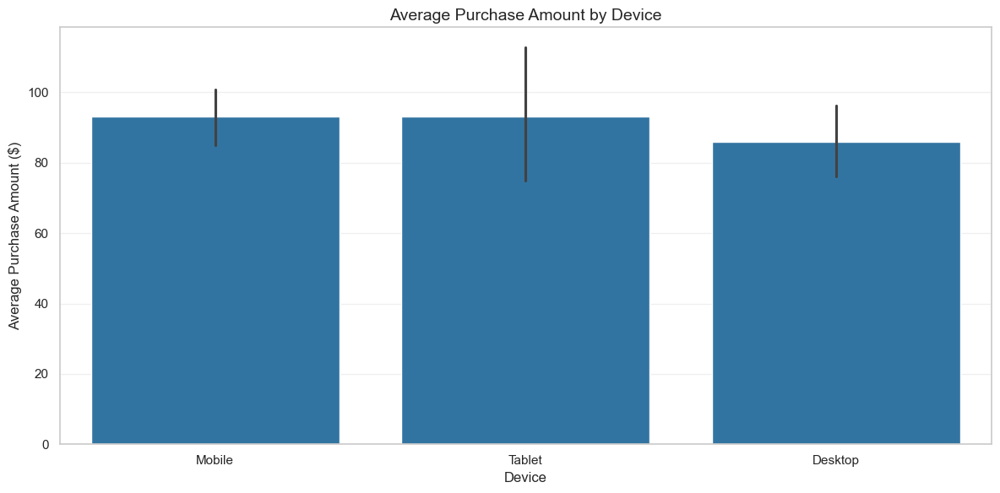

In [32]:
# 1. Bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='device', y='purchase_amount', data=ecommerce_df)
plt.title('Average Purchase Amount by Device', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Average Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

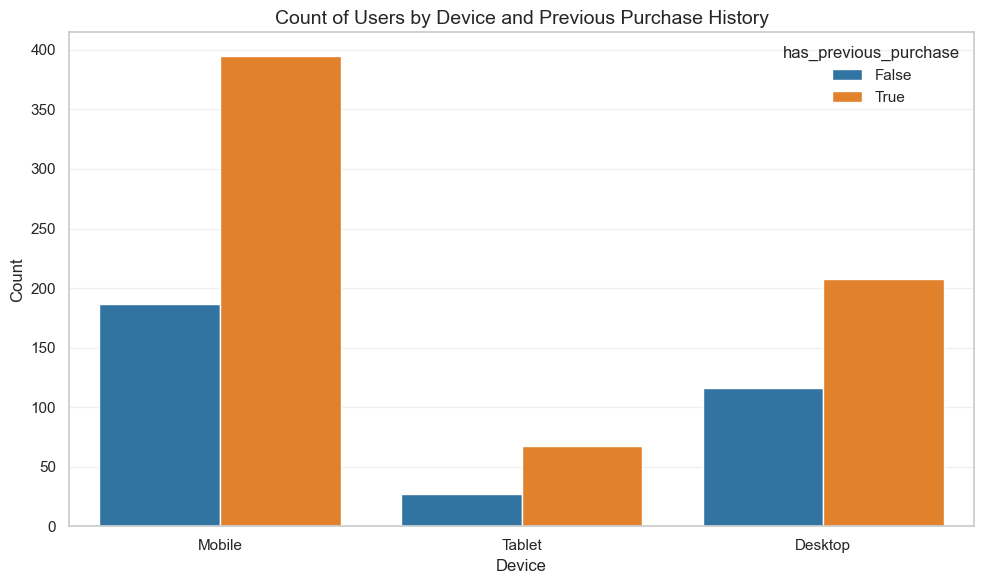

In [33]:
# 2. Count plot
plt.figure(figsize=(10, 6))
sns.countplot(x='device', hue='has_previous_purchase', data=ecommerce_df)
plt.title('Count of Users by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

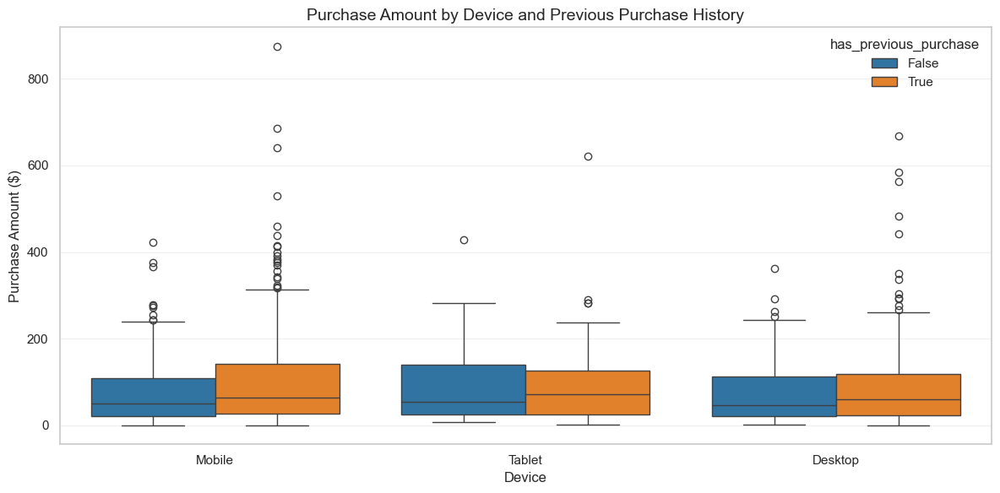

In [34]:
# 3. Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='device', y='purchase_amount', hue='has_previous_purchase', data=ecommerce_df)
plt.title('Purchase Amount by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

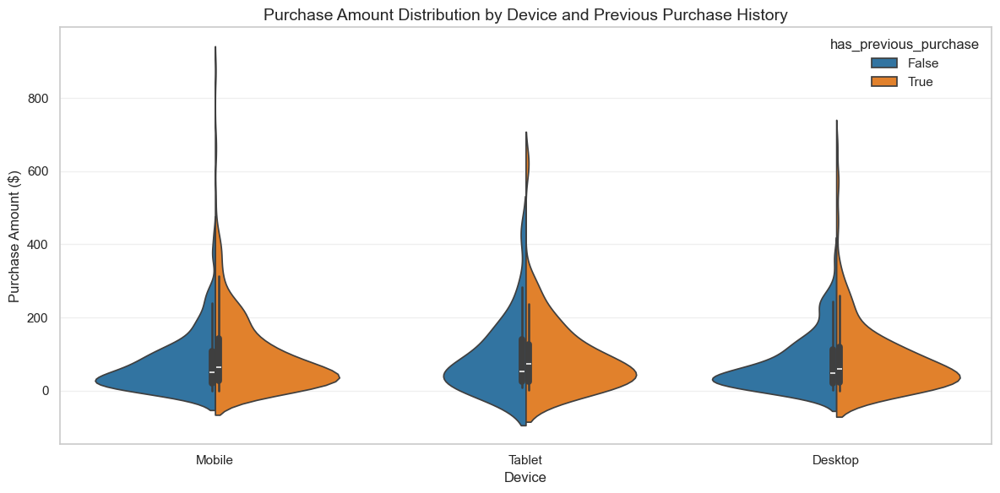

In [35]:
# 4. Violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(x='device', y='purchase_amount', hue='has_previous_purchase', 
              split=True, data=ecommerce_df)
plt.title('Purchase Amount Distribution by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

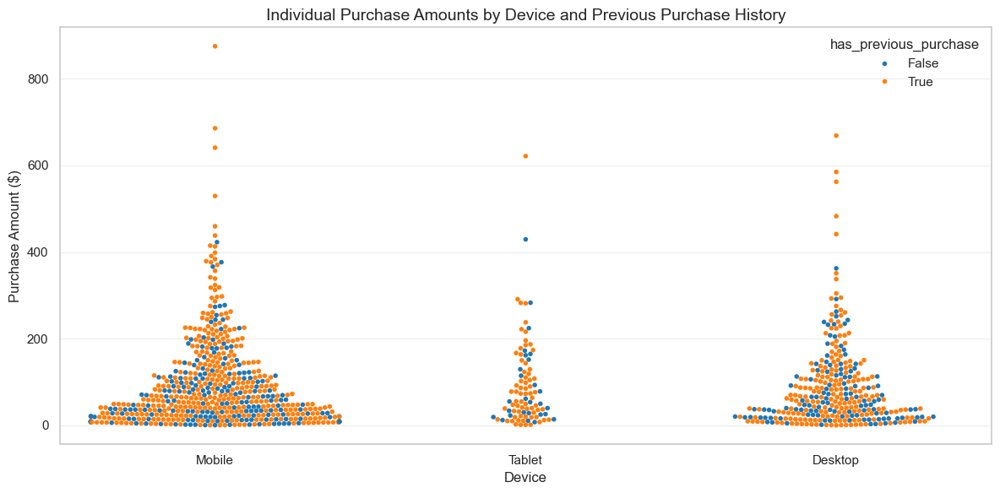

In [42]:
# 5. Swarm plot
plt.figure(figsize=(12, 6))
sns.swarmplot(x='device', y='purchase_amount', hue='has_previous_purchase', data=ecommerce_df, size=4)
plt.title('Individual Purchase Amounts by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

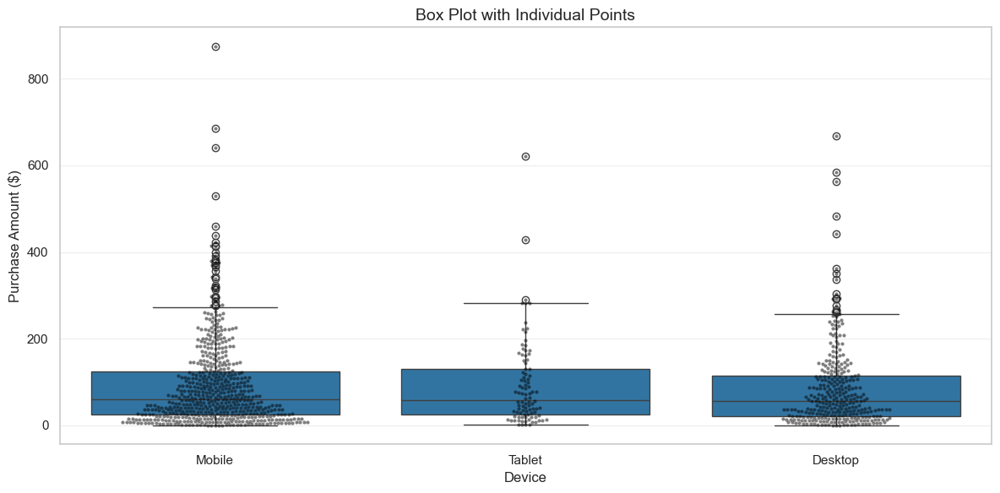

In [43]:
# 6. Combination of box plot and swarm plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='device', y='purchase_amount', data=ecommerce_df)
sns.swarmplot(x='device', y='purchase_amount', data=ecommerce_df, 
              color='black', alpha=0.5, size=3)
plt.title('Box Plot with Individual Points', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

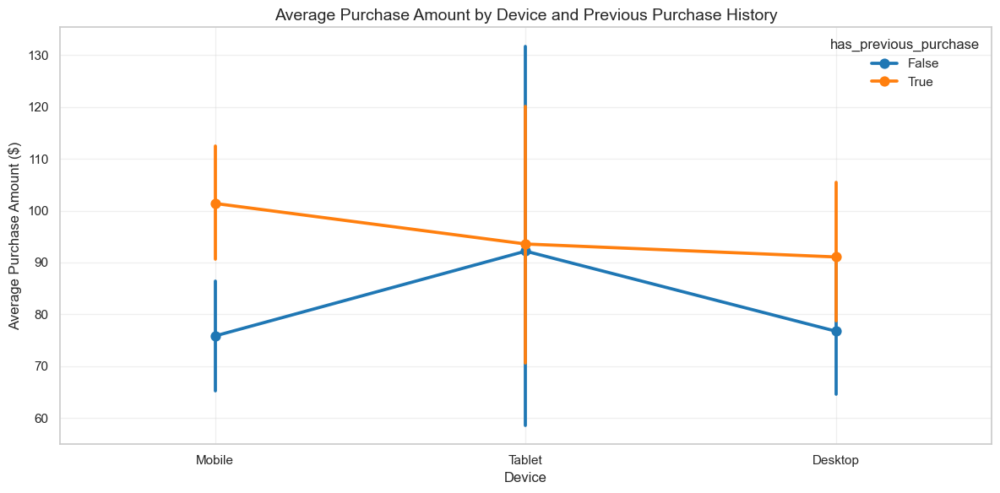

In [38]:
# 7. Point plot (showing means and confidence intervals)
plt.figure(figsize=(12, 6))
sns.pointplot(x='device', y='purchase_amount', hue='has_previous_purchase', data=ecommerce_df)
plt.title('Average Purchase Amount by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Average Purchase Amount ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

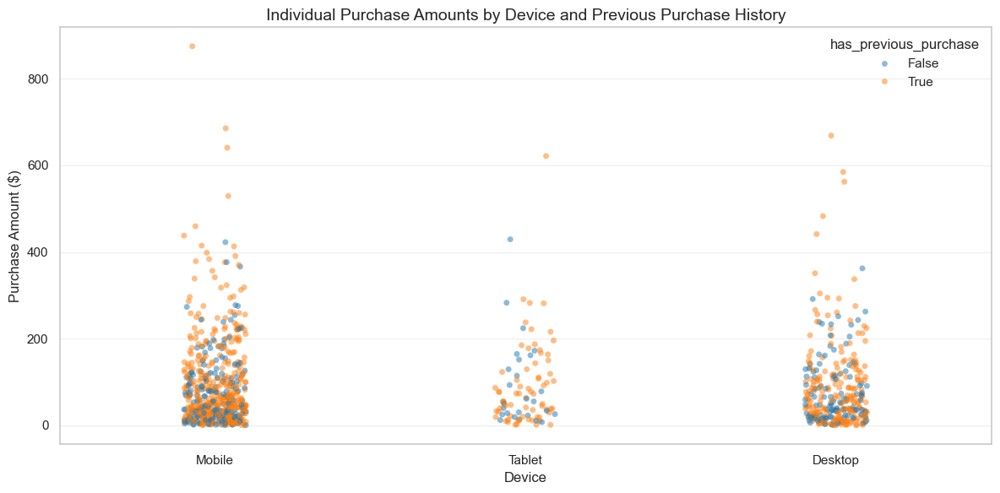

In [39]:
# 8. Categorical scatter plot
plt.figure(figsize=(12, 6))
sns.stripplot(x='device', y='purchase_amount', hue='has_previous_purchase', 
             jitter=True, alpha=0.5, data=ecommerce_df)
plt.title('Individual Purchase Amounts by Device and Previous Purchase History', fontsize=14)
plt.xlabel('Device', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

### Relational Plots

Seaborn has functions specifically designed for visualizing relationships between variables:

# Relational plots in Seaborn

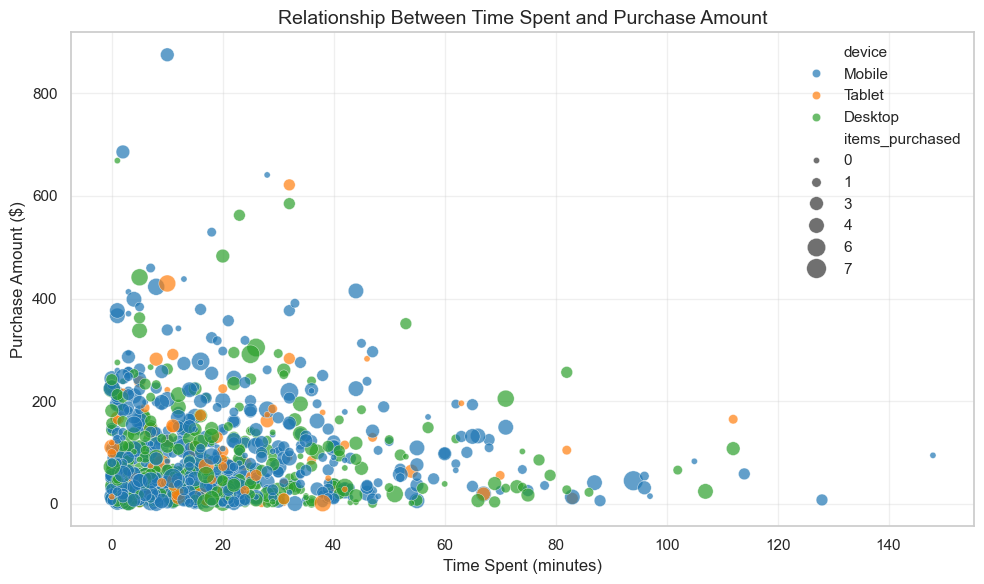

In [40]:
# 1. Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='time_spent_mins', 
    y='purchase_amount', 
    hue='device',
    size='items_purchased',  # Vary point size
    sizes=(20, 200),         # Range of sizes
    alpha=0.7,
    data=ecommerce_df
)
plt.title('Relationship Between Time Spent and Purchase Amount', fontsize=14)
plt.xlabel('Time Spent (minutes)', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

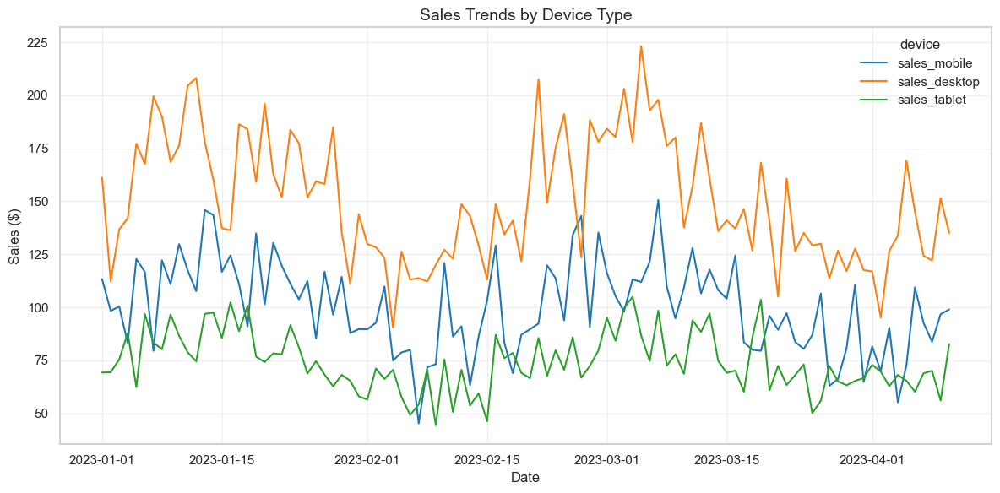

In [41]:
# 2. Line plot
# Let's create some time series data first
dates = pd.date_range(start='2023-01-01', periods=100, freq='D')
time_series_df = pd.DataFrame({
    'date': dates,
    'sales_mobile': np.random.normal(100, 15, 100) + np.sin(np.linspace(0, 4*np.pi, 100)) * 20,
    'sales_desktop': np.random.normal(150, 20, 100) + np.sin(np.linspace(0, 4*np.pi, 100)) * 30,
    'sales_tablet': np.random.normal(75, 10, 100) + np.sin(np.linspace(0, 4*np.pi, 100)) * 15
})

# Reshape data from wide to long format
time_series_long = pd.melt(
    time_series_df, 
    id_vars=['date'], 
    value_vars=['sales_mobile', 'sales_desktop', 'sales_tablet'],
    var_name='device',
    value_name='sales'
)

plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='sales', hue='device', data=time_series_long)
plt.title('Sales Trends by Device Type', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Sales ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

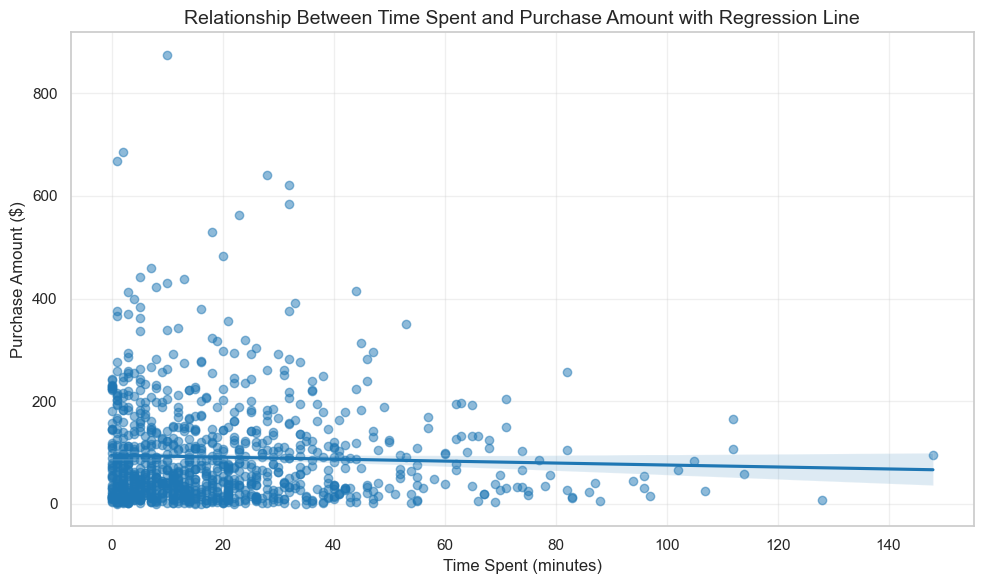

In [42]:
# 3. Regression plot
plt.figure(figsize=(10, 6))
sns.regplot(x='time_spent_mins', y='purchase_amount', data=ecommerce_df, 
           scatter_kws={'alpha': 0.5})
plt.title('Relationship Between Time Spent and Purchase Amount with Regression Line', fontsize=14)
plt.xlabel('Time Spent (minutes)', fontsize=12)
plt.ylabel('Purchase Amount ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

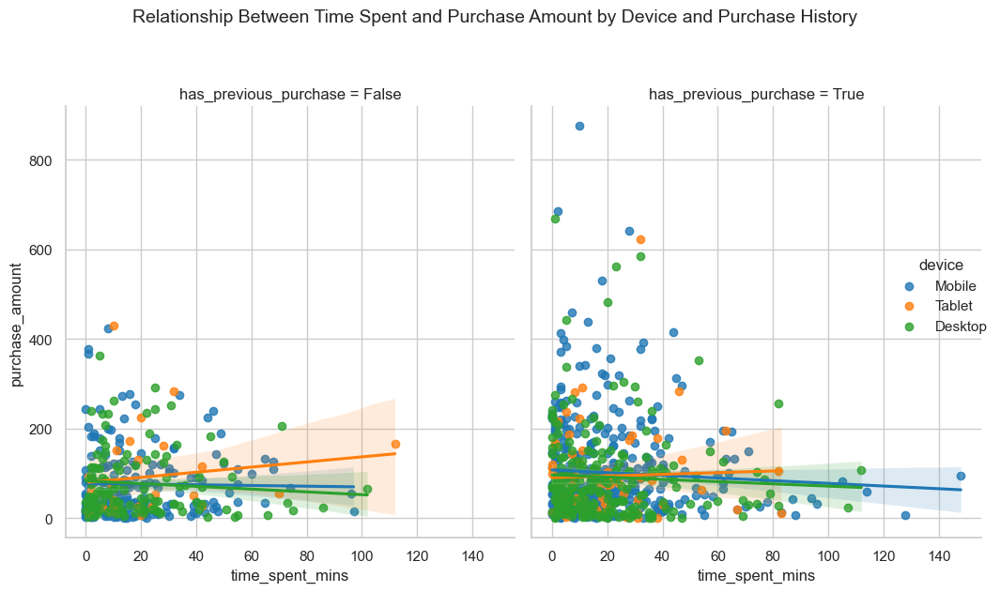

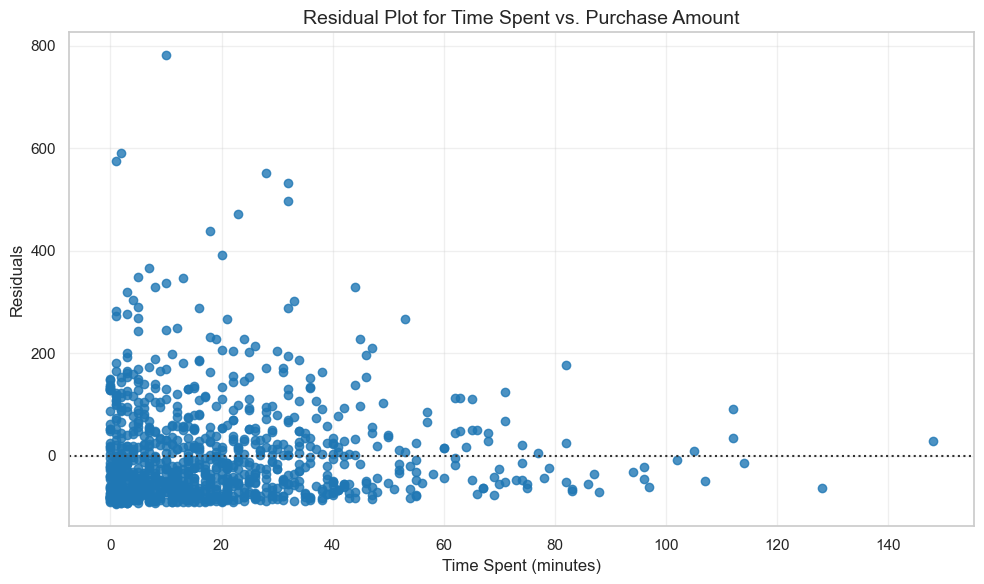

In [43]:
# 4. Regression plot by group
plt.figure(figsize=(12, 6))
sns.lmplot(
    x='time_spent_mins', 
    y='purchase_amount', 
    hue='device',
    col='has_previous_purchase',  # Create separate plots by previous purchase status
    height=6,                     # Height of each facet
    aspect=0.8,                   # Width to height ratio
    data=ecommerce_df
)
plt.suptitle('Relationship Between Time Spent and Purchase Amount by Device and Purchase History', 
             fontsize=14, y=1.05)
plt.tight_layout()
plt.show()

# 5. Residual plot
plt.figure(figsize=(10, 6))
sns.residplot(x='time_spent_mins', y='purchase_amount', data=ecommerce_df)
plt.title('Residual Plot for Time Spent vs. Purchase Amount', fontsize=14)
plt.xlabel('Time Spent (minutes)', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Exercises: Seaborn Basics

**Exercise 1**: Create a bar plot showing the average petal length for each iris species, with error bars representing 95% confidence intervals.

**Exercise 2**: Generate a scatter plot of the diabetes dataset showing the relationship between BMI and disease progression, with points colored by age.

**Exercise 3**: Create a combination of box plot and swarm plot to visualize the distribution of alcohol content across different wine classes.

## Pair Plots and Correlation Visualization

Visualizing relationships between multiple variables simultaneously is crucial for exploratory data analysis.

### Pair Plots

Pair plots create a grid of scatter plots for all pairs of variables, with histograms or KDE plots on the diagonal:

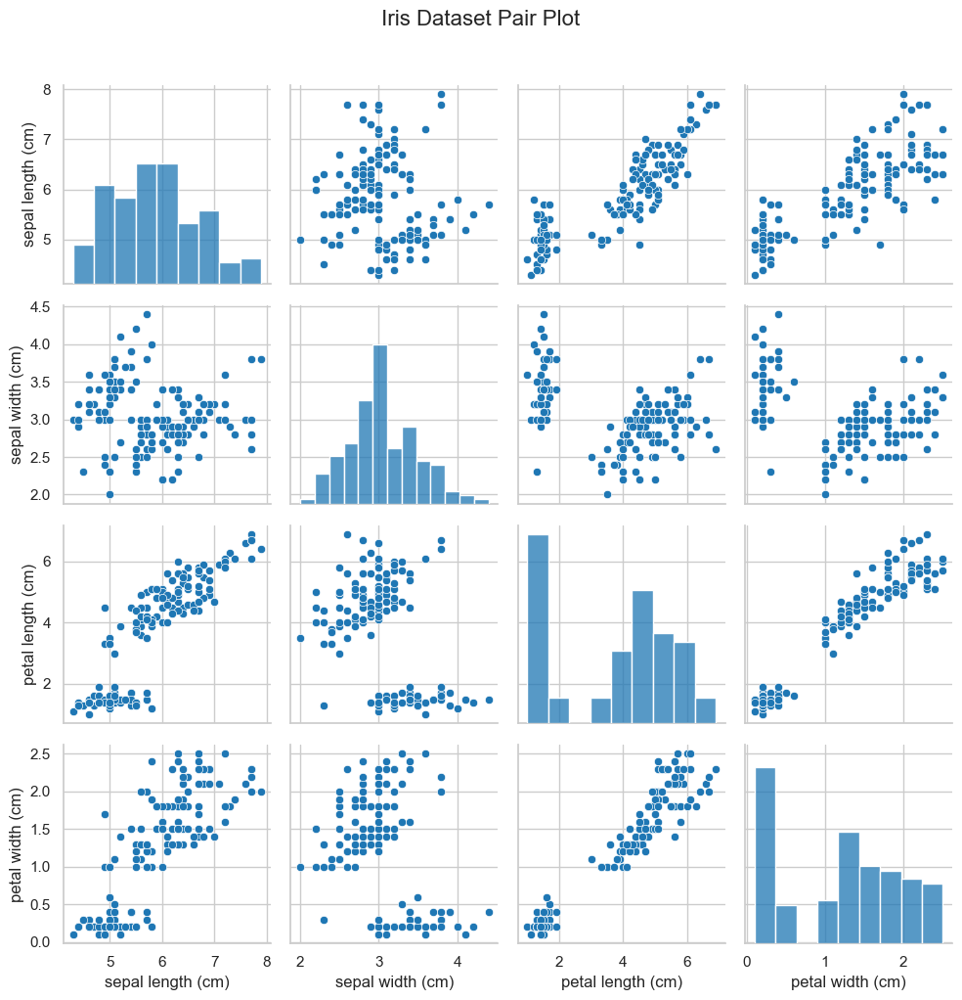

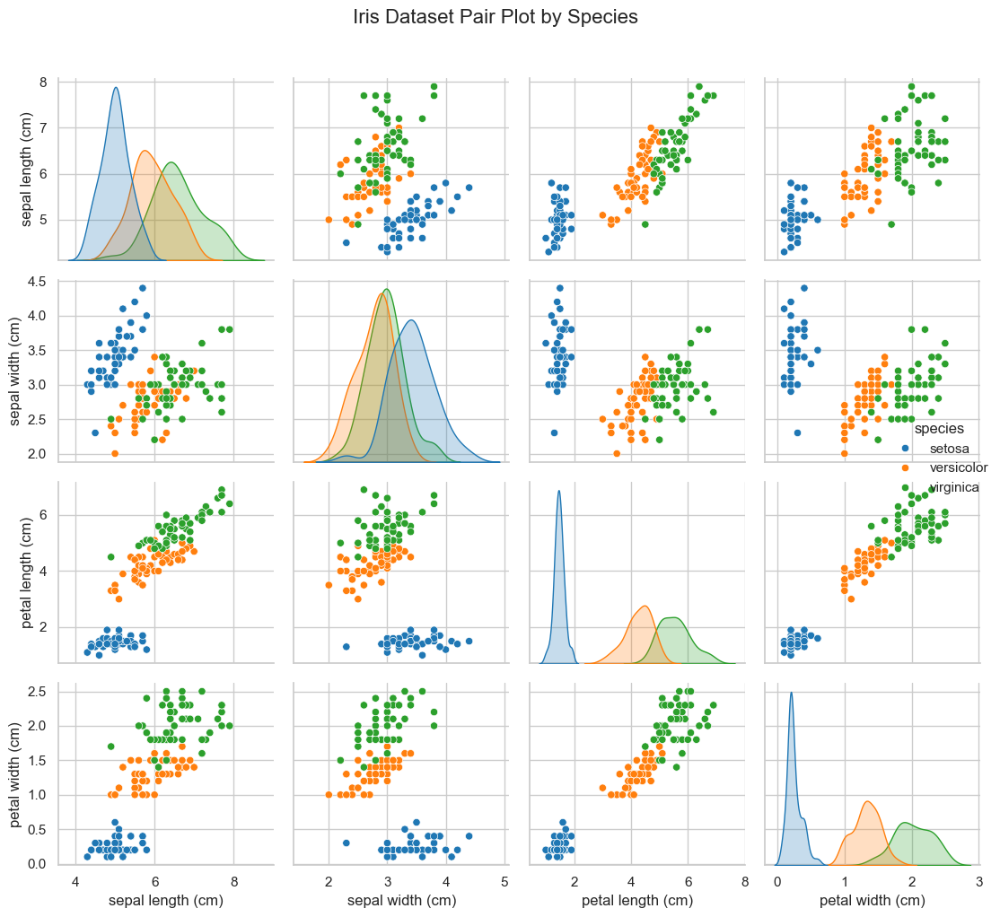

In [47]:
# Basic pair plot
sns.pairplot(iris_df)
plt.suptitle('Iris Dataset Pair Plot', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

# Pair plot with hue for categorical variable
sns.pairplot(iris_df, hue='species', palette='tab10')
plt.suptitle('Iris Dataset Pair Plot by Species', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

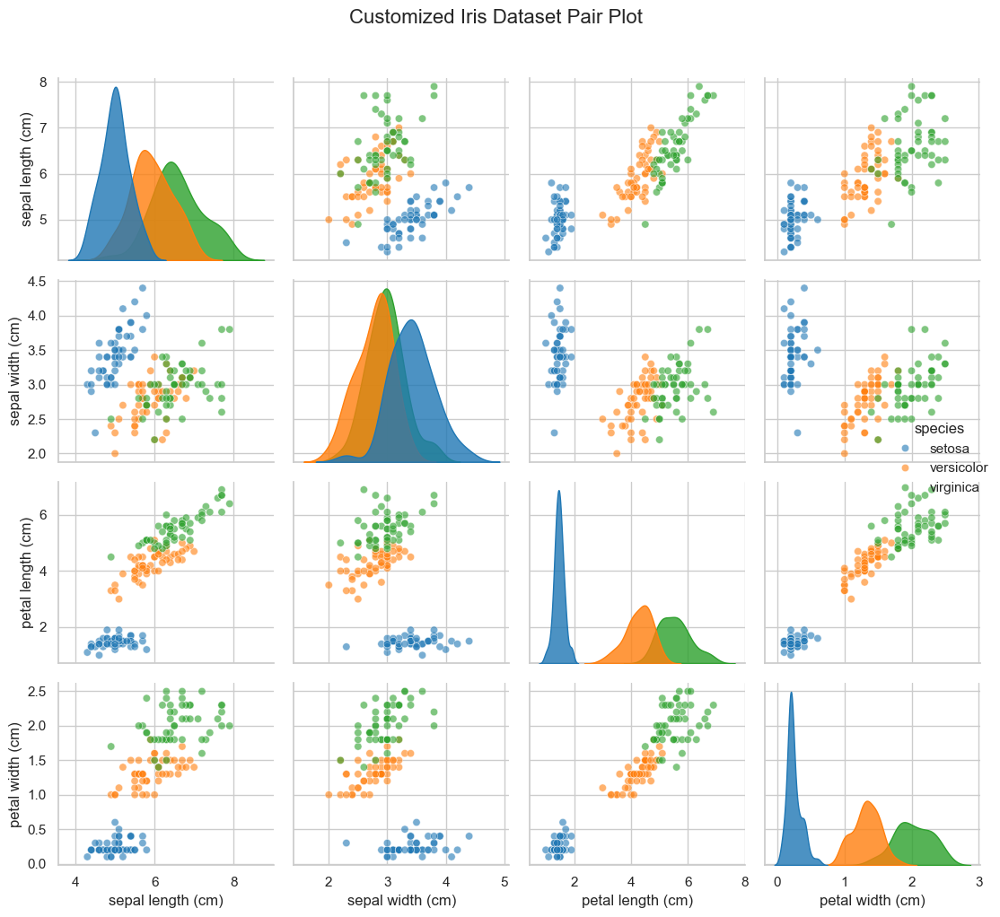

In [46]:
# Customized pair plot
sns.pairplot(
    iris_df,
    hue='species',
    diag_kind='kde',           # KDE plots on diagonal
    plot_kws={'alpha': 0.6},   # Transparency for scatter plots
    diag_kws={'alpha': 0.8},   # Transparency for diagonal plots
    height=2.5                 # Size of each subplot
)
plt.suptitle('Customized Iris Dataset Pair Plot', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

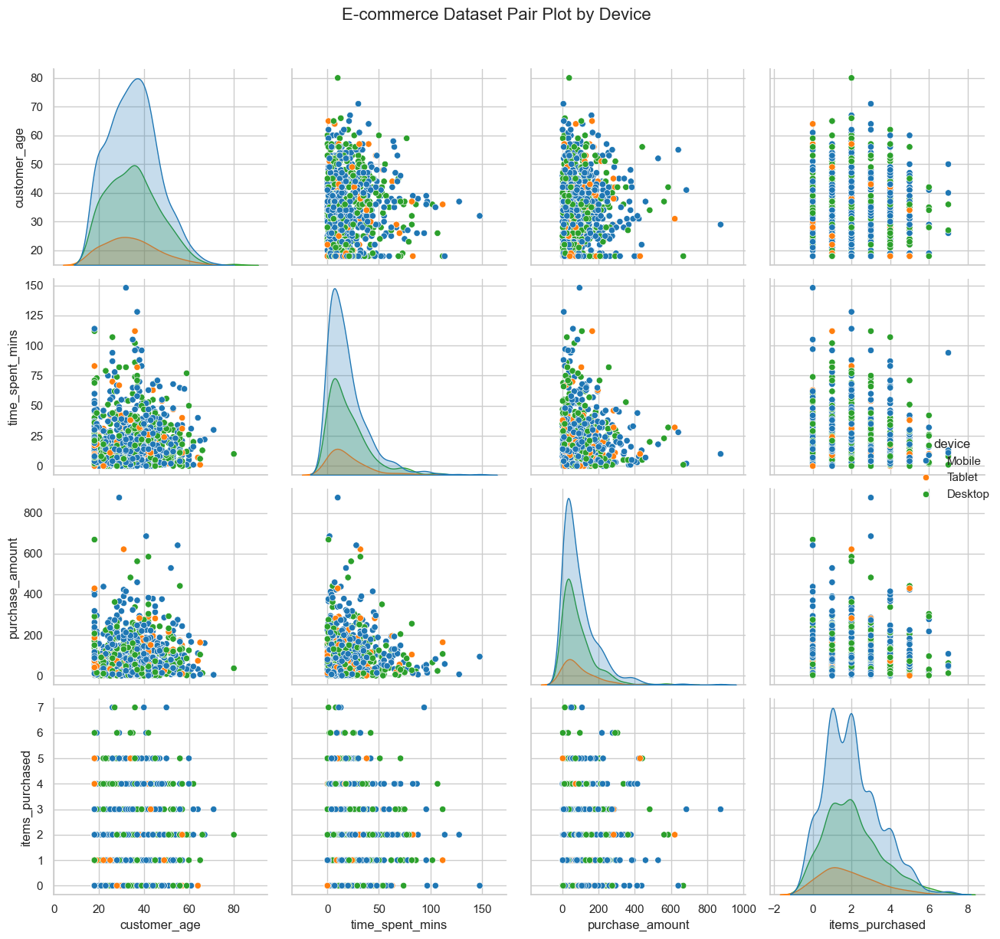

In [45]:
# Pair plot with subset of variables
selected_columns = ['customer_age', 'time_spent_mins', 'purchase_amount', 'items_purchased']
sns.pairplot(
    ecommerce_df[selected_columns + ['device']],
    hue='device',
    height=3
)
plt.suptitle('E-commerce Dataset Pair Plot by Device', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

Pair plots are useful for:
- Exploring relationships between multiple variables simultaneously
- Identifying patterns, correlations, and clusters
- Detecting outliers across multiple dimensions
- Comparing distributions across different groups (using hue)

### Joint Plots

Joint plots combine bivariate and univariate visualizations to show both the relationship between two variables and their individual distributions:

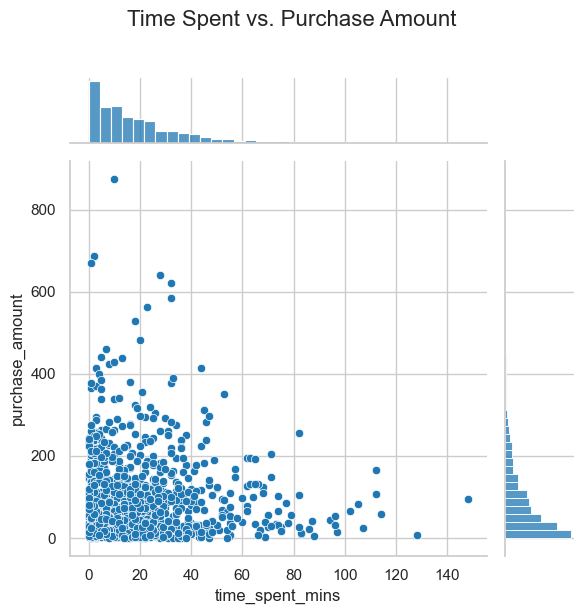

In [48]:
# Basic joint plot
sns.jointplot(
    x='time_spent_mins',
    y='purchase_amount',
    data=ecommerce_df
)
plt.suptitle('Time Spent vs. Purchase Amount', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

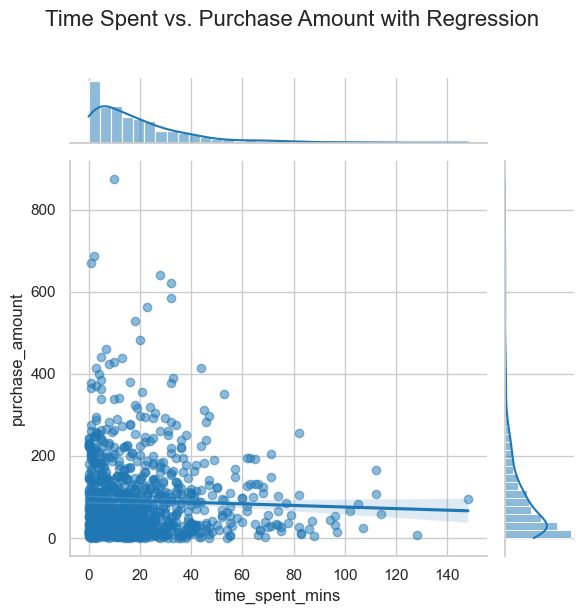

In [49]:
# Joint plot with regression line
sns.jointplot(
    x='time_spent_mins',
    y='purchase_amount',
    data=ecommerce_df,
    kind='reg',         # Include regression line
    scatter_kws={'alpha': 0.5}
)
plt.suptitle('Time Spent vs. Purchase Amount with Regression', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

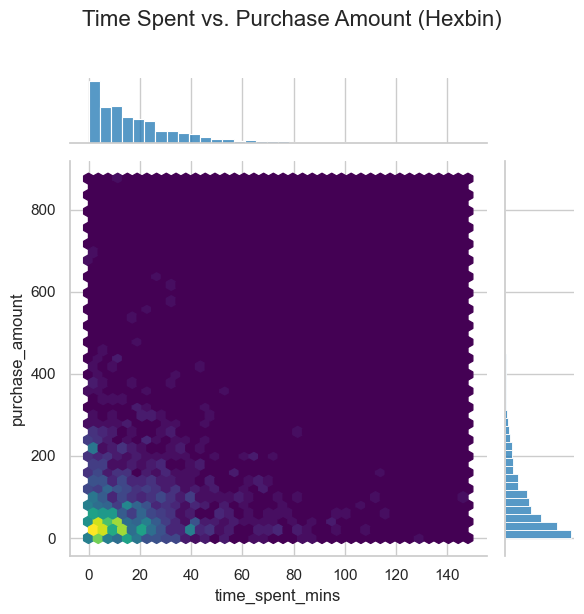

In [50]:
# Joint plot with hexbin
sns.jointplot(
    x='time_spent_mins',
    y='purchase_amount',
    data=ecommerce_df,
    kind='hex',        # Hexbin plot for density
    cmap='viridis'     # Color map
)
plt.suptitle('Time Spent vs. Purchase Amount (Hexbin)', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

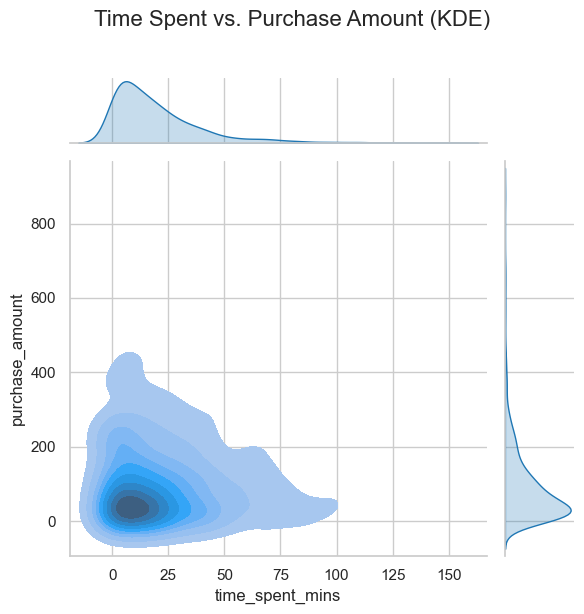

In [51]:
# Joint plot with KDE
sns.jointplot(
    x='time_spent_mins',
    y='purchase_amount',
    data=ecommerce_df,
    kind='kde',        # KDE contour plot
    fill=True          # Fill contours
)
plt.suptitle('Time Spent vs. Purchase Amount (KDE)', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

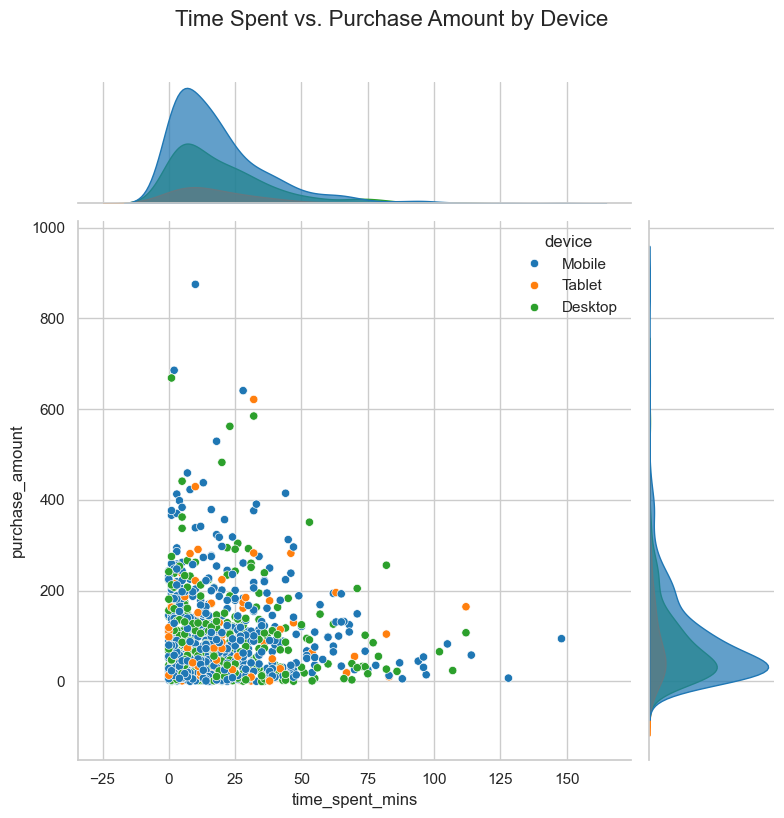

In [54]:
# Joint plot with custom histograms and scatter
sns.jointplot(
    x='time_spent_mins',
    y='purchase_amount',
    data=ecommerce_df,
    hue='device',      # Color by device
    height=8,          # Figure size
    ratio=4,           # Ratio of joint plot and marginal plots
    marginal_kws=dict(alpha=0.7)  # Histogram settings
)
plt.suptitle('Time Spent vs. Purchase Amount by Device', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

Joint plots are excellent for:
- Examining the relationship between two variables in detail
- Showing both the distribution of each variable and their joint distribution
- Identifying patterns and outliers
- Visualizing density in areas of heavy overlap

### Facet Grids

Facet grids create panels of plots based on categorical variables, allowing for complex multi-variable visualization:

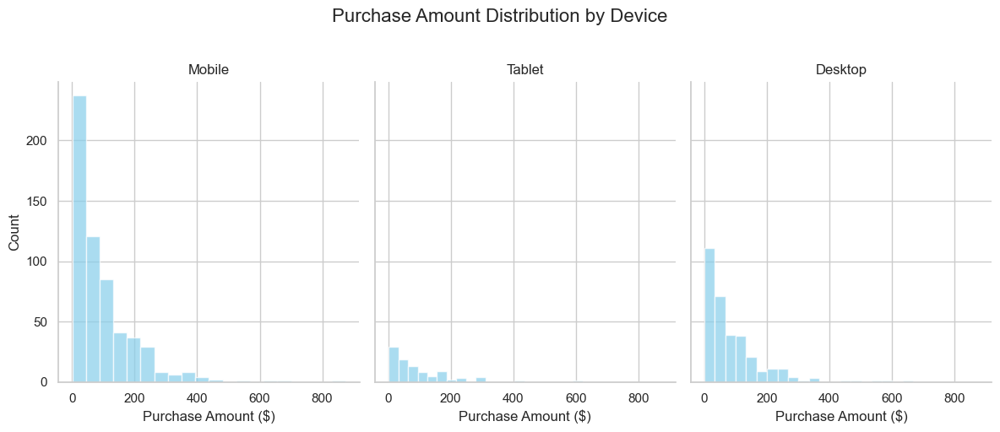

In [55]:
# FacetGrid with histograms
g = sns.FacetGrid(ecommerce_df, col='device', height=5, aspect=0.8)
g.map(plt.hist, 'purchase_amount', bins=20, alpha=0.7, color='skyblue')
g.set_axis_labels('Purchase Amount ($)', 'Count')
g.set_titles('{col_name}')
g.fig.suptitle('Purchase Amount Distribution by Device', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

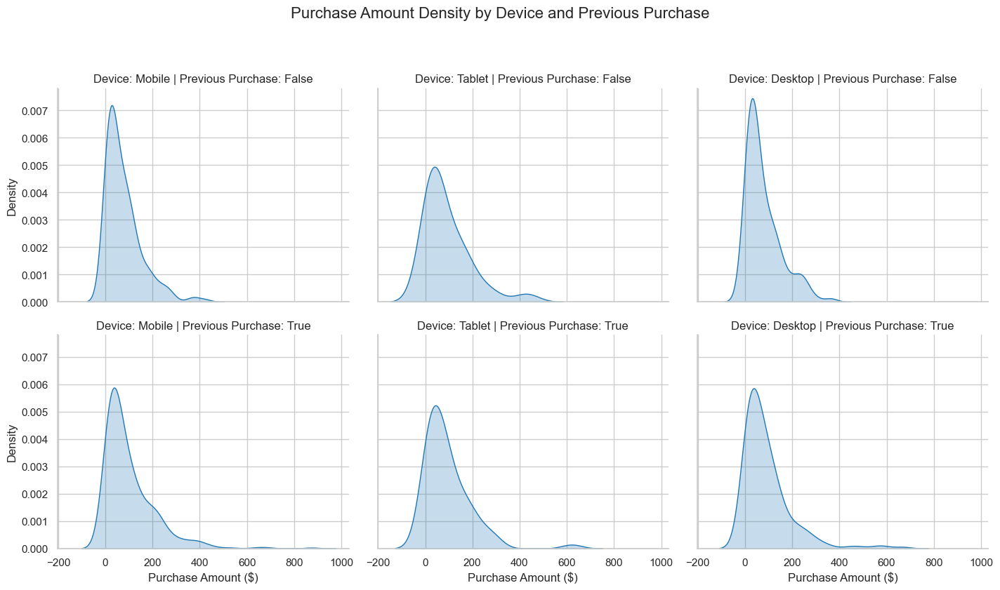

In [46]:
# FacetGrid with KDE plots and multiple rows/columns
g = sns.FacetGrid(
    ecommerce_df, 
    col='device', 
    row='has_previous_purchase',
    height=4, 
    aspect=1.2
)
g.map(sns.kdeplot, 'purchase_amount', fill=True)
g.set_axis_labels('Purchase Amount ($)', 'Density')
g.set_titles('Device: {col_name} | Previous Purchase: {row_name}')
g.fig.suptitle('Purchase Amount Density by Device and Previous Purchase', y=1.05, fontsize=16)
plt.tight_layout()
plt.show()

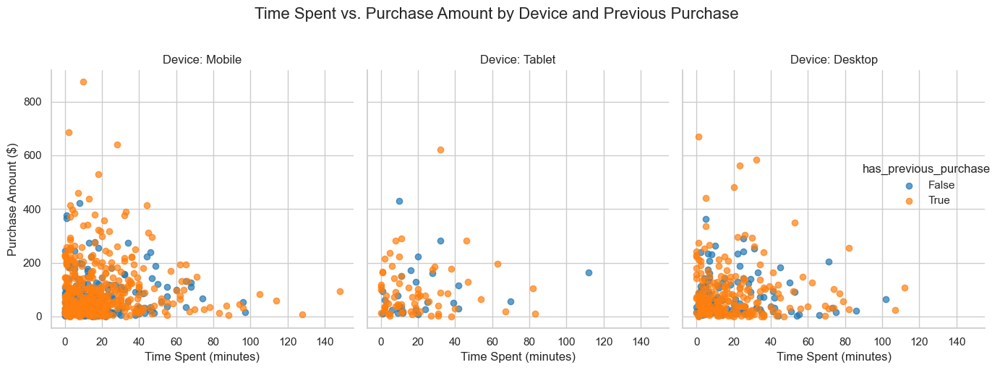

In [57]:
# FacetGrid with scatter plots
g = sns.FacetGrid(
    ecommerce_df, 
    col='device', 
    hue='has_previous_purchase',
    height=5, 
    aspect=0.8
)
g.map(plt.scatter, 'time_spent_mins', 'purchase_amount', alpha=0.7)
g.add_legend()
g.set_axis_labels('Time Spent (minutes)', 'Purchase Amount ($)')
g.set_titles('Device: {col_name}')
g.fig.suptitle('Time Spent vs. Purchase Amount by Device and Previous Purchase', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

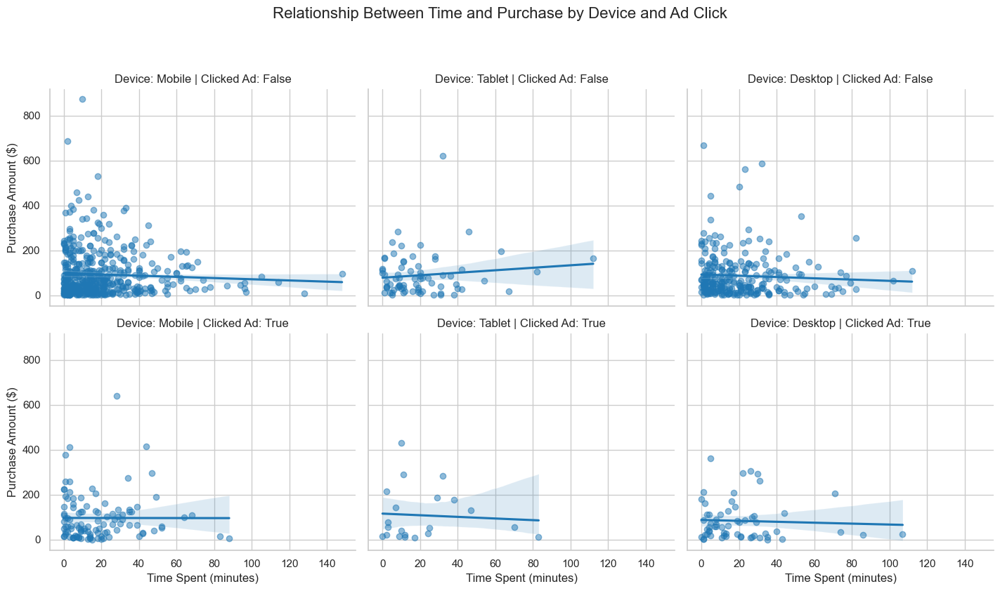

In [58]:
# FacetGrid with regression lines
g = sns.FacetGrid(
    ecommerce_df, 
    col='device', 
    row='clicked_advertisement',
    height=4, 
    aspect=1.2
)
g.map(sns.regplot, 'time_spent_mins', 'purchase_amount', scatter_kws={'alpha': 0.5})
g.set_axis_labels('Time Spent (minutes)', 'Purchase Amount ($)')
g.set_titles('Device: {col_name} | Clicked Ad: {row_name}')
g.fig.suptitle('Relationship Between Time and Purchase by Device and Ad Click', y=1.05, fontsize=16)
plt.tight_layout()
plt.show()

Facet grids are valuable for:
- Comparing relationships across multiple categorical variables
- Creating "small multiples" for easy comparison
- Breaking down complex datasets into manageable subgroups
- Identifying interactions between variables

### Exercises: Multivariate Visualization

**Exercise 1**: Create a pair plot of the wine dataset, using wine class as the hue parameter. Customize the plot with KDE plots on the diagonal.

**Exercise 2**: Generate a joint plot showing the relationship between petal length and petal width in the iris dataset, colored by species, using a KDE plot.

**Exercise 3**: Use FacetGrid to create a series of histograms showing the distribution of glucose levels in the diabetes dataset, separated by age groups (create age bins like '20-30', '30-40', etc.).

## Heatmaps for Correlation Analysis

Heatmaps are powerful tools for visualizing matrices of data, particularly correlation matrices.

### Creating Correlation Matrices

First, let's create correlation matrices from our datasets:

In [51]:
# Compute correlation matrix for iris dataset
iris_corr = iris_df.drop('species', axis=1).corr()
print("Iris Dataset Correlation Matrix:")
iris_corr

Iris Dataset Correlation Matrix:


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
sepal length (cm),1.000000,-0.117570,0.871754,0.817941
sepal width (cm),-0.117570,1.000000,-0.428440,-0.366126
petal length (cm),0.871754,-0.428440,1.000000,0.962865
petal width (cm),0.817941,-0.366126,0.962865,1.000000


In [52]:
# Compute correlation matrix for selected e-commerce features
ecom_features = ['customer_age', 'time_spent_mins', 'pages_visited', 
                 'purchase_amount', 'items_purchased', 'session_duration',
                 'days_since_last_visit']
ecom_corr = ecommerce_df[ecom_features].corr()
print("\nE-commerce Dataset Correlation Matrix:")
ecom_corr


E-commerce Dataset Correlation Matrix:


,customer_age,time_spent_mins,pages_visited,purchase_amount,items_purchased,session_duration,days_since_last_visit
customer_age,1.000000,0.000050,0.037539,0.005610,-0.042963,-0.004117,-0.046168
time_spent_mins,0.000050,1.000000,0.010073,-0.038843,-0.029641,0.030314,-0.012634
pages_visited,0.037539,0.010073,1.000000,-0.003453,0.090944,-0.049582,0.041086
purchase_amount,0.005610,-0.038843,-0.003453,1.000000,0.030738,0.028279,0.041614
items_purchased,-0.042963,-0.029641,0.090944,0.030738,1.000000,0.000227,0.006976
session_duration,-0.004117,0.030314,-0.049582,0.028279,0.000227,1.000000,-0.001853
days_since_last_visit,-0.046168,-0.012634,0.041086,0.041614,0.006976,-0.001853,1.000000


In [53]:
# Compute correlation matrix for diabetes dataset
diabetes_corr = diabetes_df.drop('target', axis=1).corr()
print("\nDiabetes Dataset Correlation Matrix:")
diabetes_corr.round(2).head()


Diabetes Dataset Correlation Matrix:


,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
age,1.00,0.17,0.19,0.34,0.26,0.22,-0.08,0.20,0.27,0.30
sex,0.17,1.00,0.09,0.24,0.04,0.14,-0.38,0.33,0.15,0.21
bmi,0.19,0.09,1.00,0.40,0.25,0.26,-0.37,0.41,0.45,0.39
bp,0.34,0.24,0.40,1.00,0.24,0.19,-0.18,0.26,0.39,0.39
s1,0.26,0.04,0.25,0.24,1.00,0.90,0.05,0.54,0.52,0.33


### Basic Heatmaps

Creating simple heatmaps to visualize correlations:

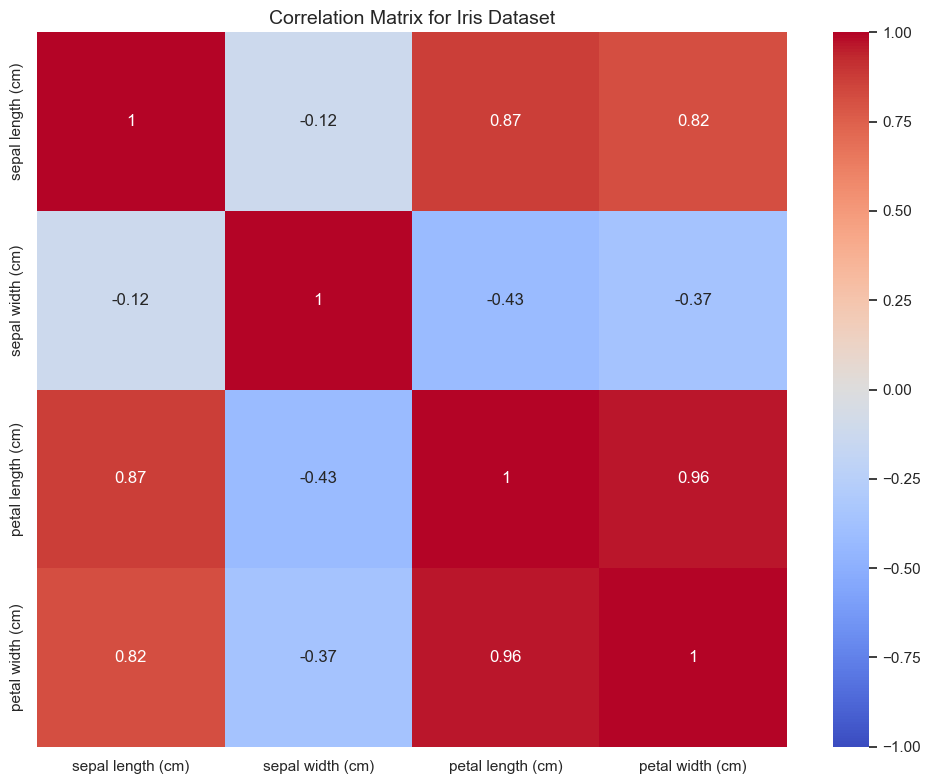

In [54]:
# Basic heatmap of iris dataset correlations
plt.figure(figsize=(10, 8))
sns.heatmap(iris_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix for Iris Dataset', fontsize=14)
plt.tight_layout()
plt.show()

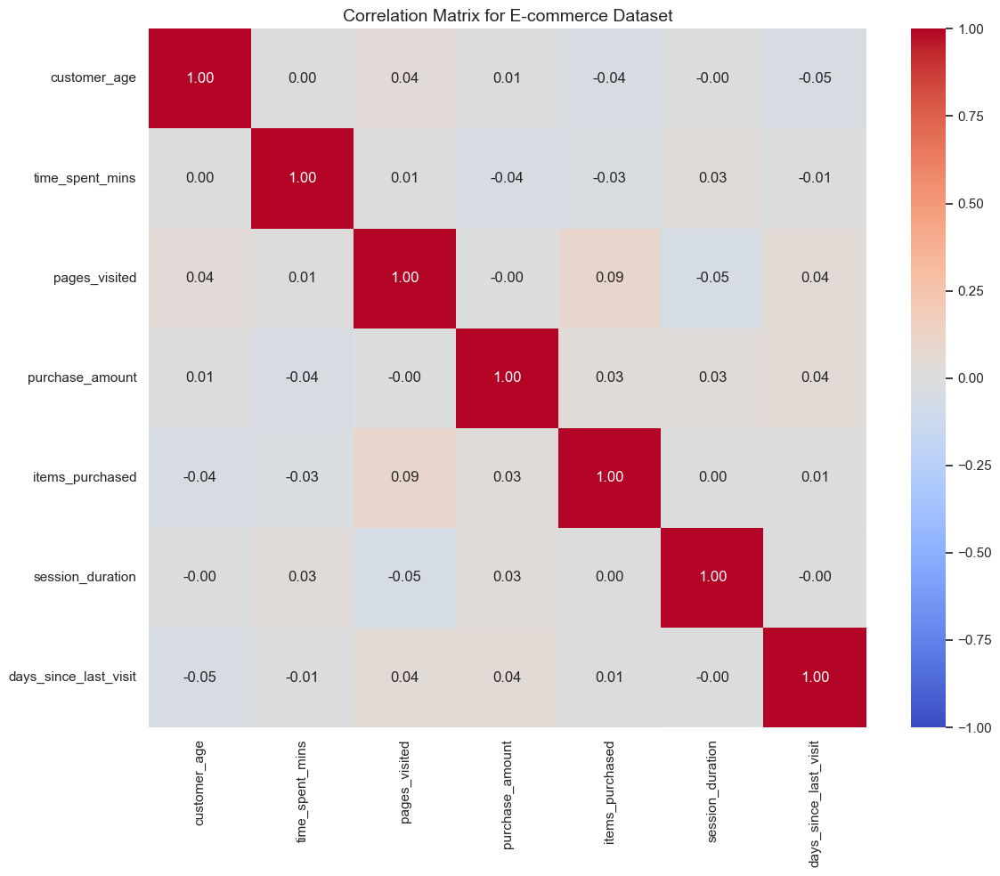

In [55]:
# Heatmap of e-commerce dataset correlations
plt.figure(figsize=(12, 10))
sns.heatmap(ecom_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix for E-commerce Dataset', fontsize=14)
plt.tight_layout()
plt.show()

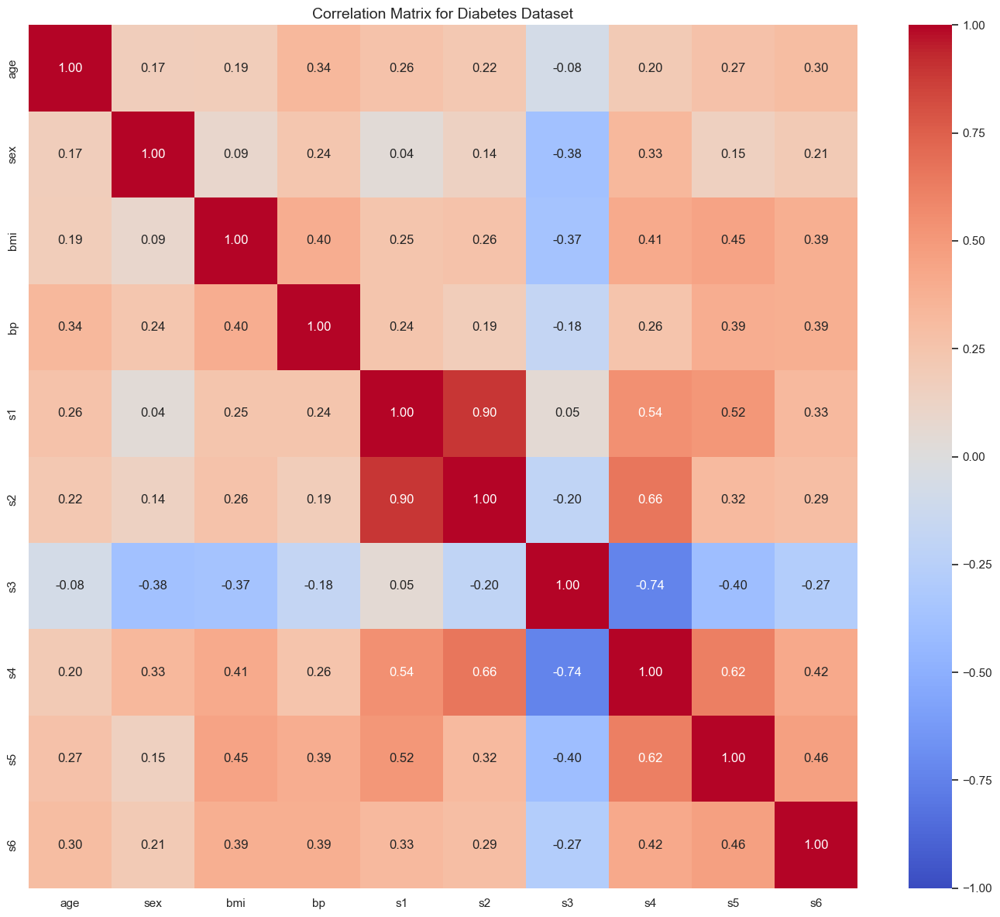

In [56]:
# Heatmap of diabetes dataset correlations
plt.figure(figsize=(14, 12))
sns.heatmap(diabetes_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix for Diabetes Dataset', fontsize=14)
plt.tight_layout()
plt.show()

### Clustered Heatmaps

Using clustering to reorder rows and columns for better pattern visibility:

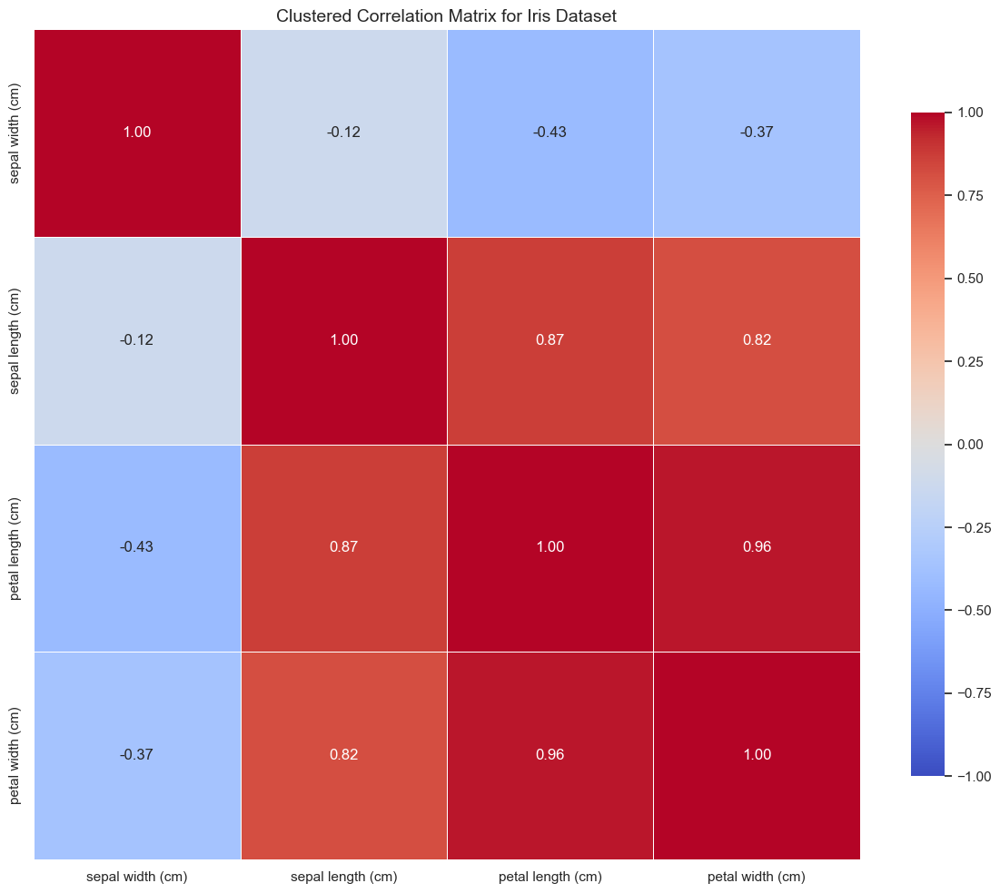

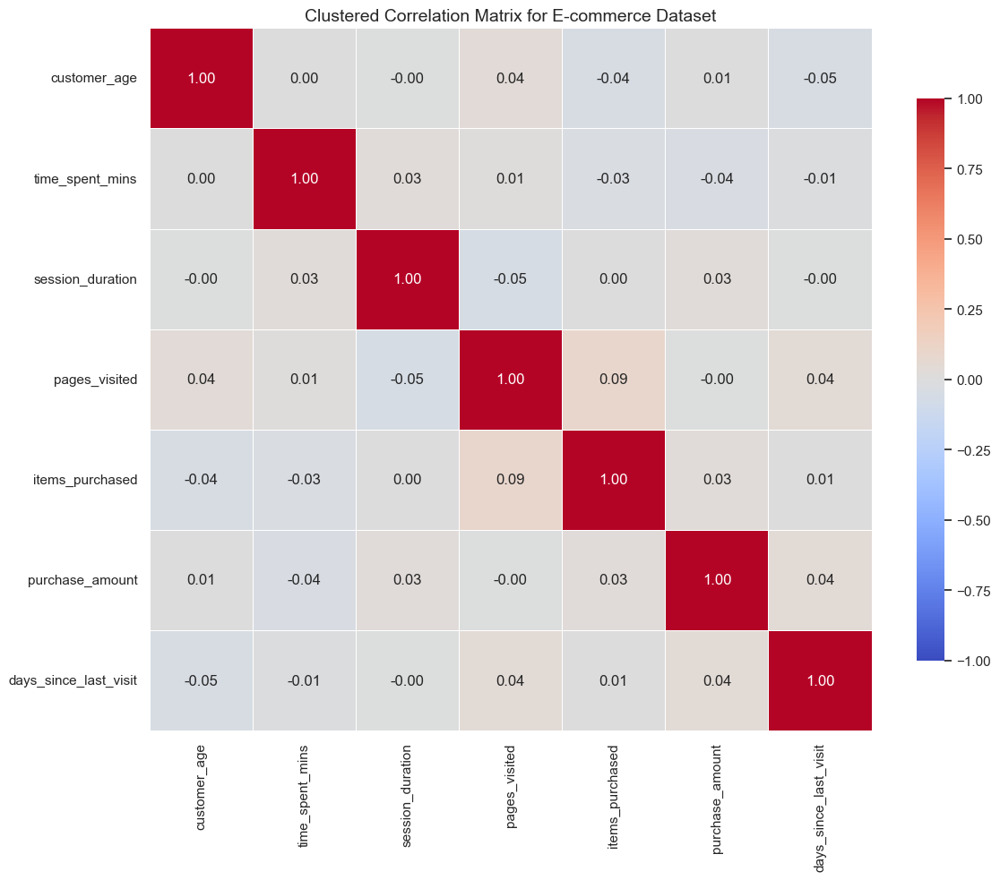

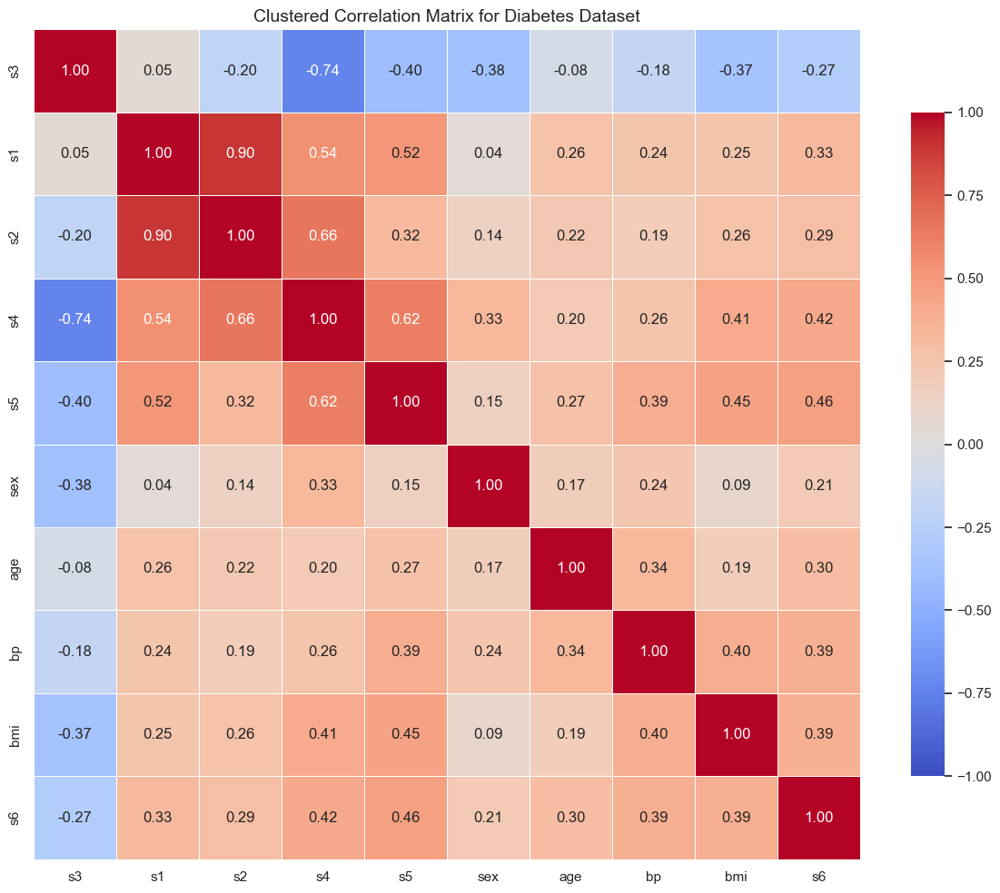

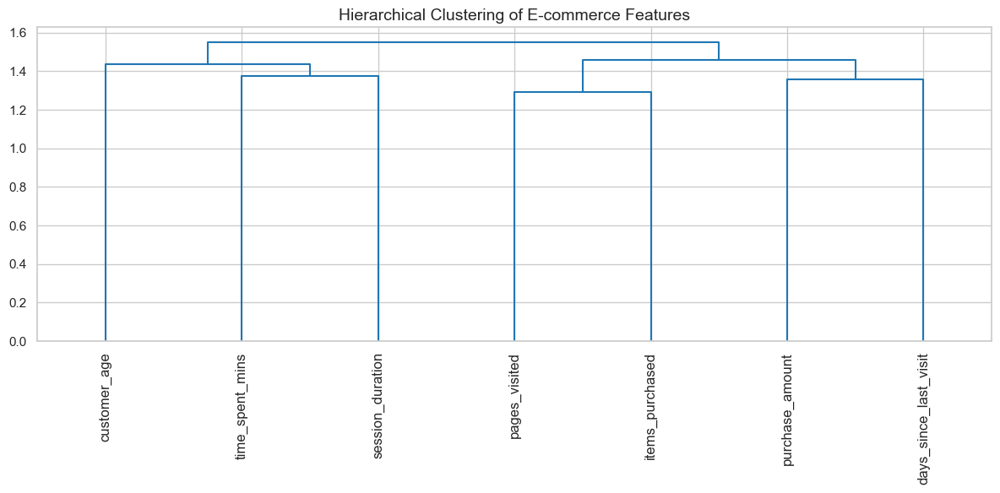

In [57]:
# Import clustering libraries
from scipy.cluster import hierarchy
from scipy.spatial import distance

# Function to create a clustered heatmap
def plot_clustered_heatmap(corr_matrix, title):
    """
    Create a clustered heatmap from a correlation matrix.
    
    Parameters:
    -----------
    corr_matrix : pandas.DataFrame
        Correlation matrix to visualize
    title : str
        Title for the heatmap
    
    Returns:
    --------
    tuple : (reordered_idx, linkage)
        The reordered indices and linkage matrix
    """
    # Calculate linkage matrix for clustering
    linkage = hierarchy.linkage(distance.pdist(corr_matrix), method='ward')
    
    # Get the indices for reordering
    dendro = hierarchy.dendrogram(linkage, no_plot=True)
    reordered_idx = dendro['leaves']
    
    # Reorder correlation matrix
    reordered_corr = corr_matrix.iloc[reordered_idx, reordered_idx]
    
    # Create the heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        reordered_corr, 
        annot=True, 
        cmap='coolwarm', 
        vmin=-1, 
        vmax=1, 
        fmt='.2f',
        linewidths=0.5,
        cbar_kws={"shrink": 0.8}
    )
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Return both the reordered indices and the linkage matrix
    return reordered_idx, linkage
    
# Plot clustered heatmaps
idx_iris, linkage_iris = plot_clustered_heatmap(iris_corr, 'Clustered Correlation Matrix for Iris Dataset')
idx_ecom, linkage_ecom = plot_clustered_heatmap(ecom_corr, 'Clustered Correlation Matrix for E-commerce Dataset')
idx_diabetes, linkage_diabetes = plot_clustered_heatmap(diabetes_corr, 'Clustered Correlation Matrix for Diabetes Dataset')

# Add a dendrogram to visualize the clustering
plt.figure(figsize=(12, 6))
hierarchy.dendrogram(
    linkage_ecom,
    labels=ecom_corr.columns,
    leaf_rotation=90,
    leaf_font_size=12
)
plt.title('Hierarchical Clustering of E-commerce Features', fontsize=14)
plt.axhline(y=5, color='r', linestyle='--', alpha=0.5)  # Add a threshold line
plt.tight_layout()
plt.show()

### Annotated Heatmaps

Creating more informative heatmaps with custom annotations and advanced formatting:

In [58]:
# Create a masked heatmap (showing only the lower triangle)
def plot_masked_heatmap(corr_matrix, title):
    """
    Create a masked heatmap showing only the lower triangle.
    
    Parameters:
    -----------
    corr_matrix : pandas.DataFrame
        Correlation matrix to visualize
    title : str
        Title for the heatmap
    """
    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    
    # Create the heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        corr_matrix,
        mask=mask,
        annot=True,
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        fmt='.2f',
        linewidths=0.5,
        square=True,         # Make each cell square
        cbar_kws={"shrink": 0.8}
    )
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.show()

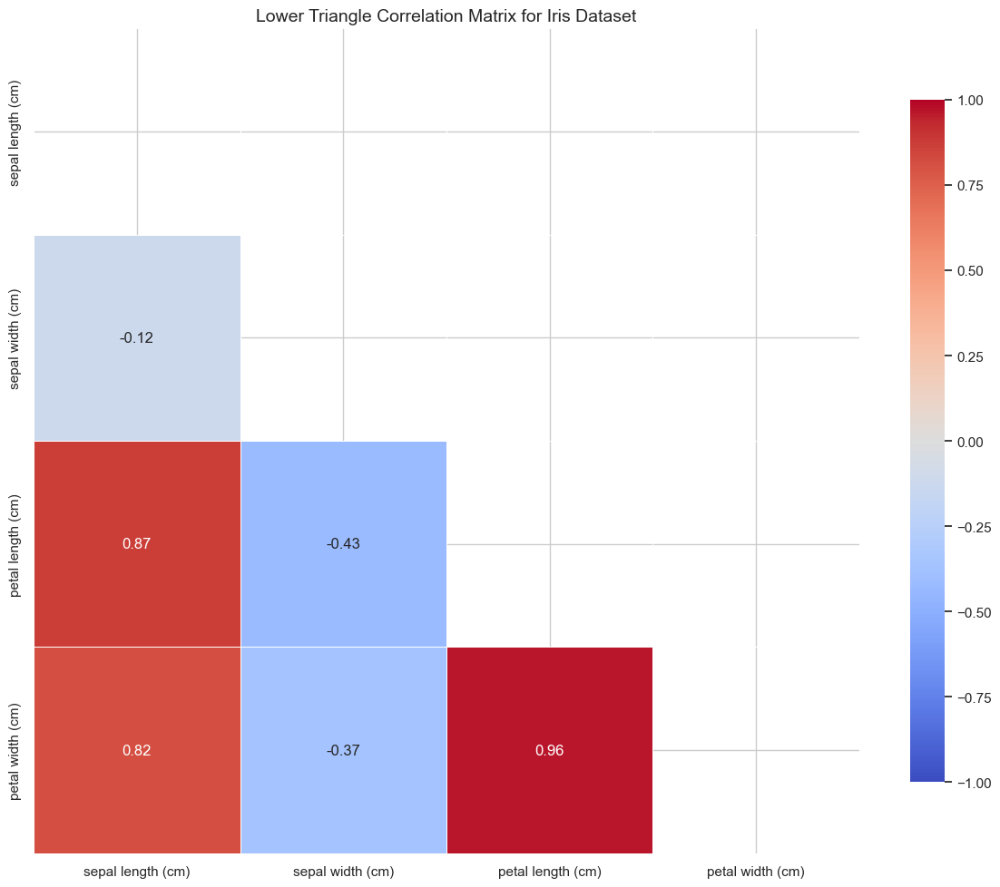

In [59]:
# Plot masked heatmaps
plot_masked_heatmap(iris_corr, 'Lower Triangle Correlation Matrix for Iris Dataset')

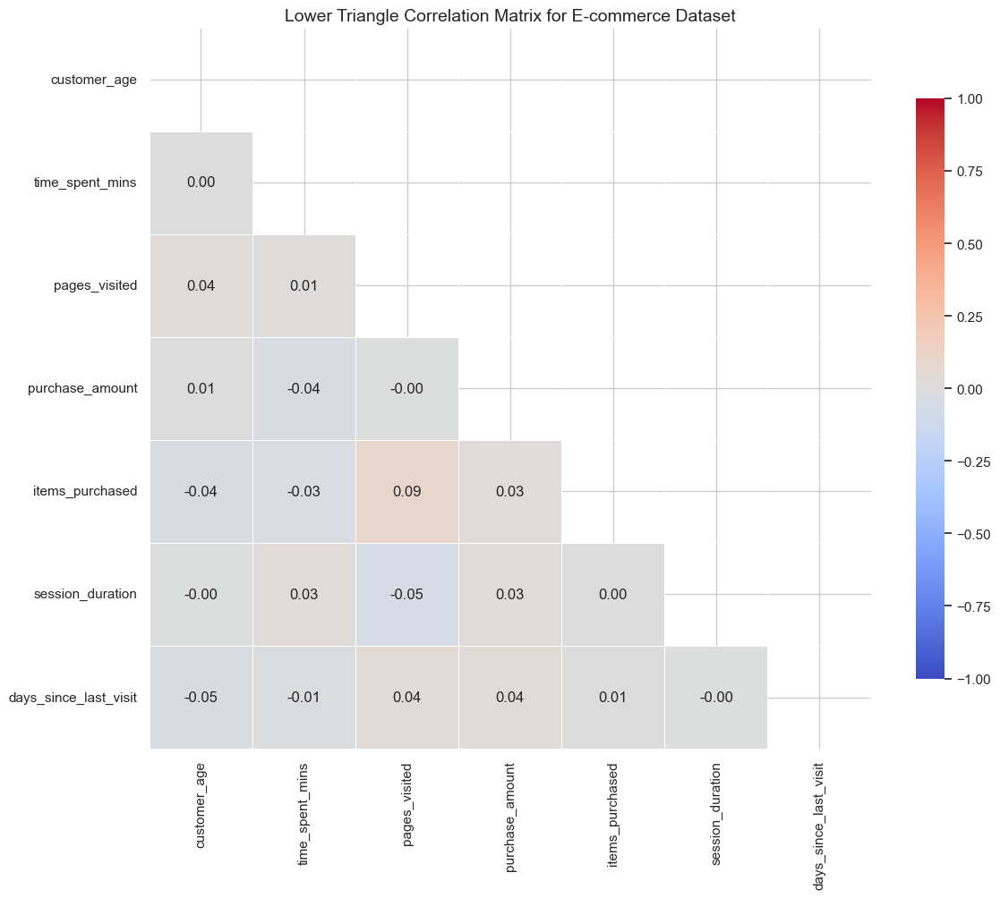

In [60]:
plot_masked_heatmap(ecom_corr, 'Lower Triangle Correlation Matrix for E-commerce Dataset')

In [61]:
def plot_highlighted_heatmap(corr_matrix, title, threshold=0.5):
    """
    Create a heatmap with highlighted strong correlations.
    
    Parameters:
    -----------
    corr_matrix : pandas.DataFrame
        Correlation matrix to visualize
    title : str
        Title for the heatmap
    threshold : float
        Threshold for highlighting strong correlations
    """
    # Create a mask for significant correlations
    mask = np.abs(corr_matrix) >= threshold
    
    # Create two separate annotation arrays
    # One with all correlations formatted
    annot_all = np.zeros_like(corr_matrix.values, dtype='<U10')
    for i in range(corr_matrix.shape[0]):
        for j in range(corr_matrix.shape[1]):
            annot_all[i, j] = f"{corr_matrix.iloc[i, j]:.2f}"
    
    # Another with asterisks added to significant correlations
    annot_significant = annot_all.copy()
    for i in range(corr_matrix.shape[0]):
        for j in range(corr_matrix.shape[1]):
            if mask.iloc[i, j] and i != j:  # Skip diagonal
                annot_significant[i, j] = annot_all[i, j] + "*"
    
    # Create the heatmap
    plt.figure(figsize=(12, 10))
    ax = sns.heatmap(
        corr_matrix,
        annot=annot_significant,  # Use the array with asterisks
        fmt='',  # No formatting - data is already formatted
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        center=0,
        linewidths=0.5,
        annot_kws={"size": 10},
        cbar_kws={"shrink": 0.8, "label": "Correlation Coefficient"}
    )
    
    plt.title(title, fontsize=14)
    plt.figtext(0.5, 0.01, f"* Correlations with absolute value ≥ {threshold}", 
                ha="center", fontsize=12)
    plt.tight_layout()
    plt.show()

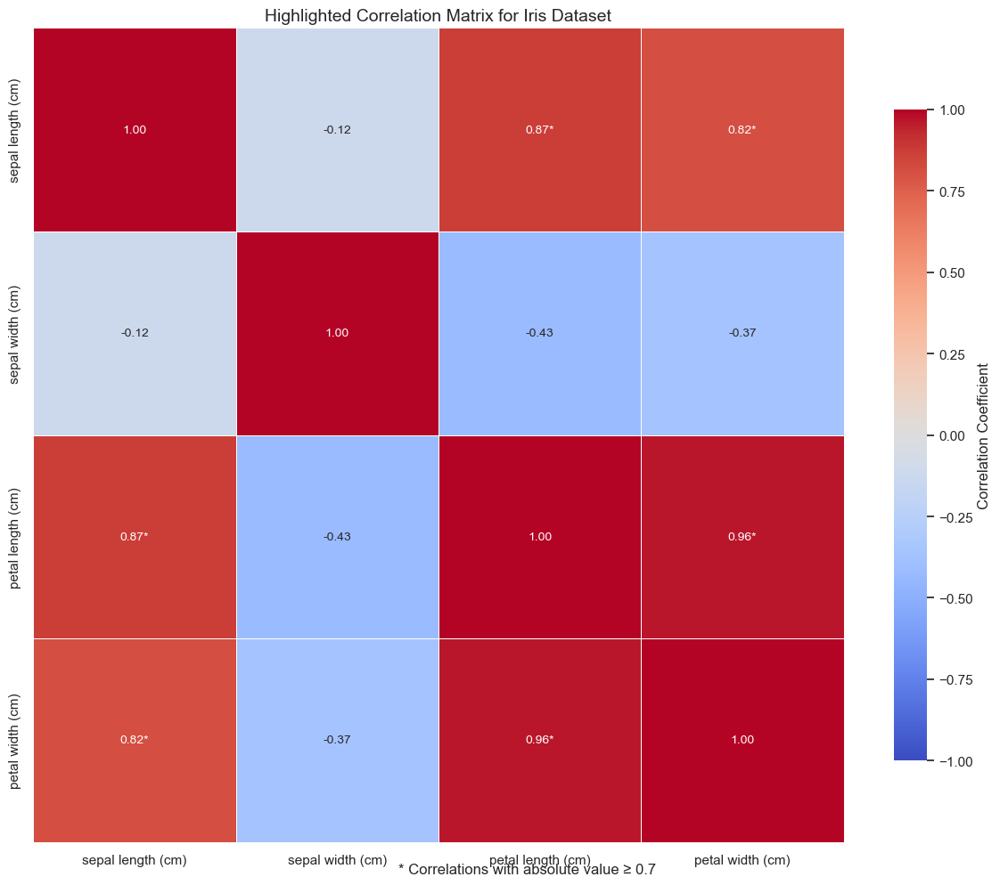

In [62]:
# Plot highlighted heatmaps
plot_highlighted_heatmap(iris_corr, 'Highlighted Correlation Matrix for Iris Dataset', threshold=0.7)

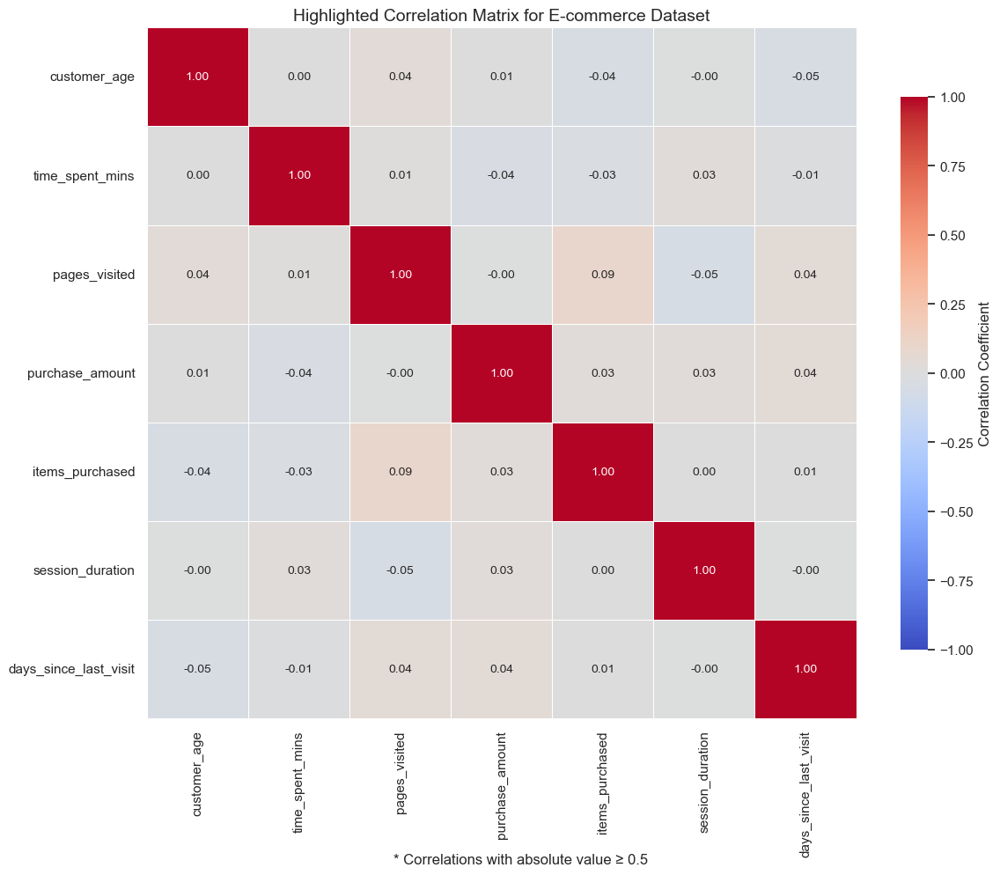

In [63]:
plot_highlighted_heatmap(ecom_corr, 'Highlighted Correlation Matrix for E-commerce Dataset', threshold=0.5)

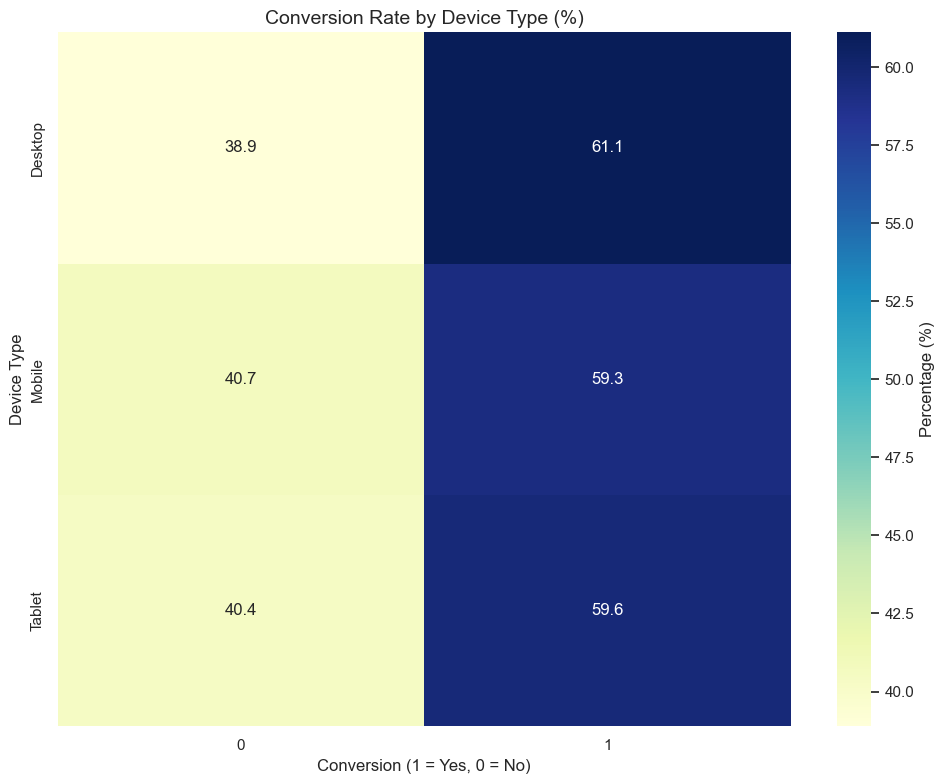

In [64]:
# Heatmap with categorical variables (crosstabulation)
# Create a crosstabulation of device type and conversion
device_conversion = pd.crosstab(
    ecommerce_df['device'], 
    ecommerce_df['conversion'],
    normalize='index'  # Normalize by row (device)
) * 100  # Convert to percentage

plt.figure(figsize=(10, 8))
sns.heatmap(
    device_conversion,
    annot=True,
    cmap='YlGnBu',
    fmt='.1f',  # Format as float with 1 decimal place
    cbar_kws={"label": "Percentage (%)"}
)
plt.title('Conversion Rate by Device Type (%)', fontsize=14)
plt.xlabel('Conversion (1 = Yes, 0 = No)')
plt.ylabel('Device Type')
plt.tight_layout()
plt.show()

### Exercises: Correlation Analysis

**Exercise 1**: Create a correlation matrix for the wine dataset and visualize it using a heatmap. Highlight correlations with an absolute value greater than 0.7.

**Exercise 2**: Generate a clustered heatmap of the diabetes dataset correlation matrix. Identify groups of features that tend to be correlated.

**Exercise 3**: Create a categorical heatmap showing the relationship between wine class and alcohol content (binned into categories like 'low', 'medium', 'high').

## Interactive Visualization with Plotly

While static visualizations are useful, interactive visualizations can provide deeper insights and better engagement.

### Introduction to Plotly Express

Plotly Express is a high-level API for creating interactive visualizations:

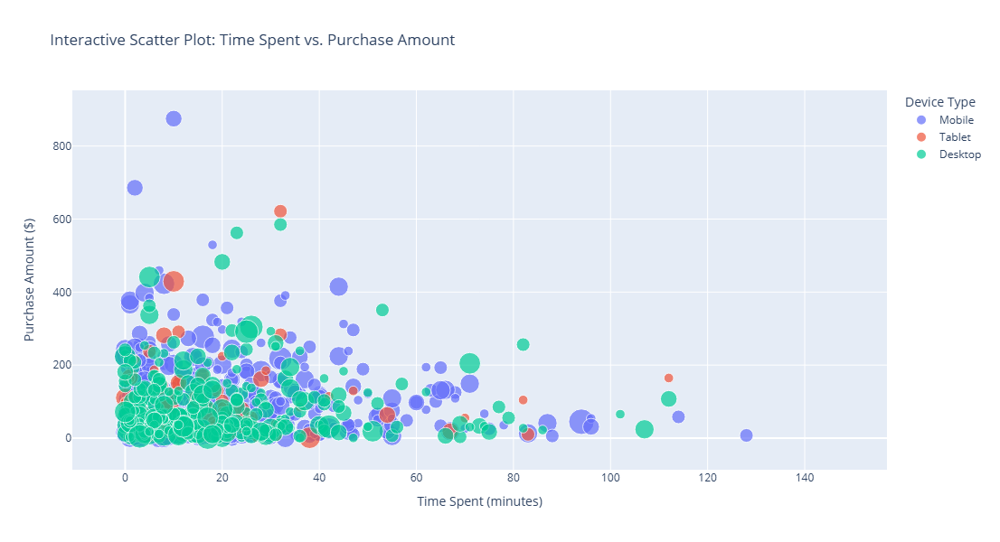

In [89]:
# Import Plotly Express
import plotly.express as px

# Basic scatter plot with Plotly Express
fig = px.scatter(
    ecommerce_df,
    x='time_spent_mins',
    y='purchase_amount',
    color='device',
    size='items_purchased',
    hover_name='customer_age',
    hover_data=['session_duration', 'pages_visited'],
    title='Interactive Scatter Plot: Time Spent vs. Purchase Amount'
)

# Update layout for better appearance
fig.update_layout(
    xaxis_title='Time Spent (minutes)',
    yaxis_title='Purchase Amount ($)',
    legend_title='Device Type',
    height=600,
    width=900
)

# Show the plot
fig.show()  # This will render in a notebook environment or browser

### Basic Interactive Plots

Creating various types of interactive plots with Plotly:

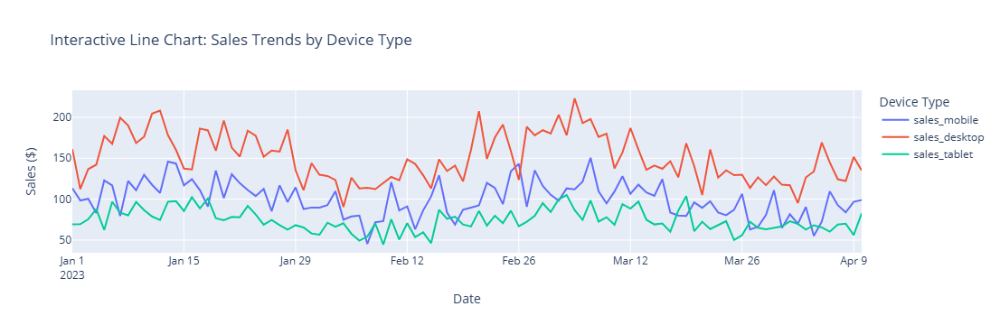

In [90]:
# Line chart
fig = px.line(
    time_series_long,
    x='date',
    y='sales',
    color='device',
    line_group='device',
    title='Interactive Line Chart: Sales Trends by Device Type'
)

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales ($)',
    legend_title='Device Type',
    hovermode='x unified'  # Show all points at the same x value
)

fig.show()

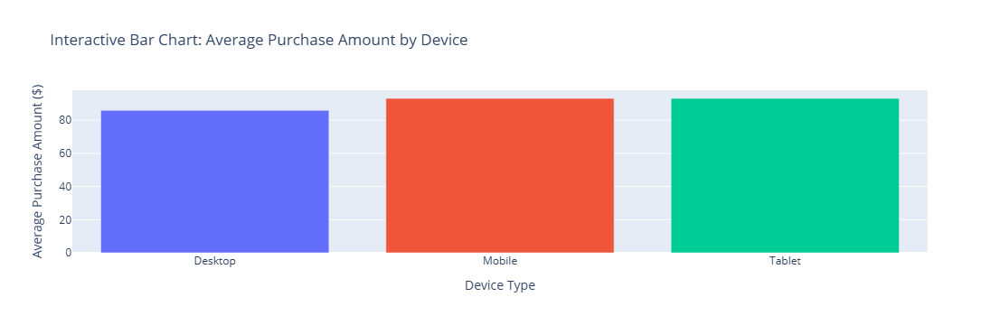

In [91]:
# Bar chart
fig = px.bar(
    ecommerce_df.groupby('device')['purchase_amount'].mean().reset_index(),
    x='device',
    y='purchase_amount',
    color='device',
    title='Interactive Bar Chart: Average Purchase Amount by Device'
)

fig.update_layout(
    xaxis_title='Device Type',
    yaxis_title='Average Purchase Amount ($)',
    showlegend=False
)

fig.show()

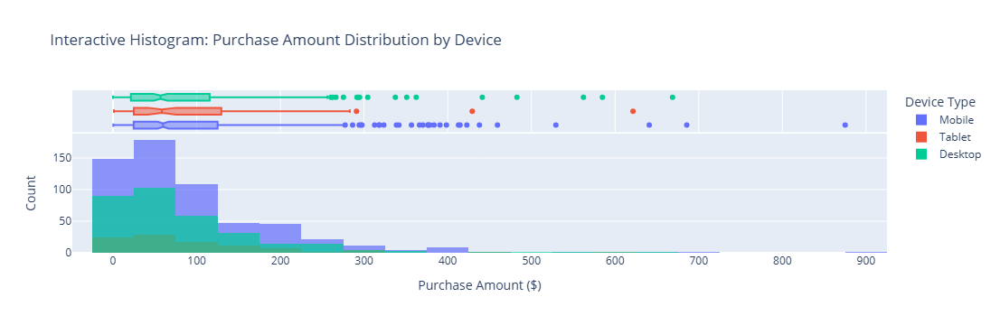

In [92]:
# Histogram
fig = px.histogram(
    ecommerce_df,
    x='purchase_amount',
    color='device',
    marginal='box',  # Add a box plot to the top
    nbins=30,
    opacity=0.7,
    title='Interactive Histogram: Purchase Amount Distribution by Device'
)

fig.update_layout(
    xaxis_title='Purchase Amount ($)',
    yaxis_title='Count',
    legend_title='Device Type',
    barmode='overlay'  # Overlay the histograms
)

fig.show()

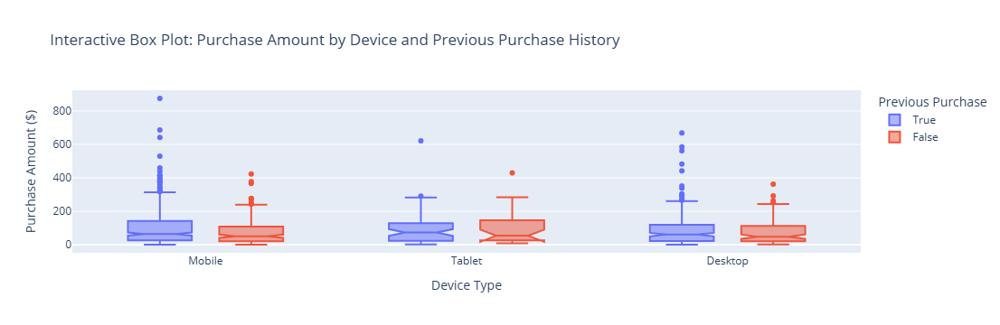

In [93]:
# Box plot
fig = px.box(
    ecommerce_df,
    x='device',
    y='purchase_amount',
    color='has_previous_purchase',
    notched=True,  # Add notches for confidence intervals
    points='outliers',  # Show only outliers as individual points
    title='Interactive Box Plot: Purchase Amount by Device and Previous Purchase History'
)

fig.update_layout(
    xaxis_title='Device Type',
    yaxis_title='Purchase Amount ($)',
    legend_title='Previous Purchase'
)

fig.show()

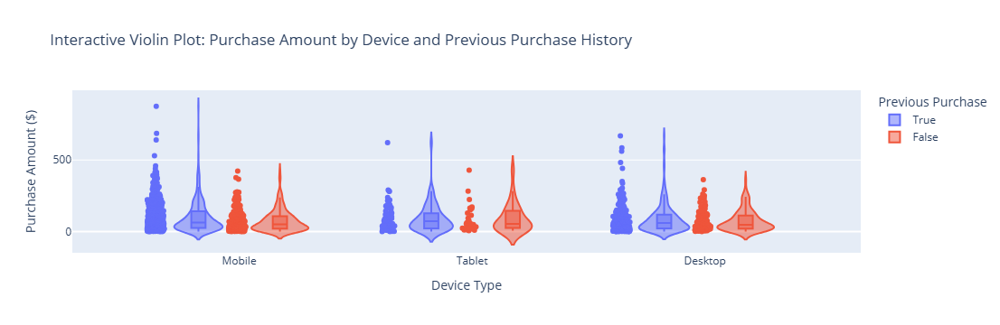

In [94]:
# Violin plot
fig = px.violin(
    ecommerce_df,
    x='device',
    y='purchase_amount',
    color='has_previous_purchase',
    box=True,  # Include box plot inside
    points='all',  # Show all points
    title='Interactive Violin Plot: Purchase Amount by Device and Previous Purchase History'
)

fig.update_layout(
    xaxis_title='Device Type',
    yaxis_title='Purchase Amount ($)',
    legend_title='Previous Purchase'
)

fig.show()

### Adding Interactivity

Enhancing plots with additional interactive features:

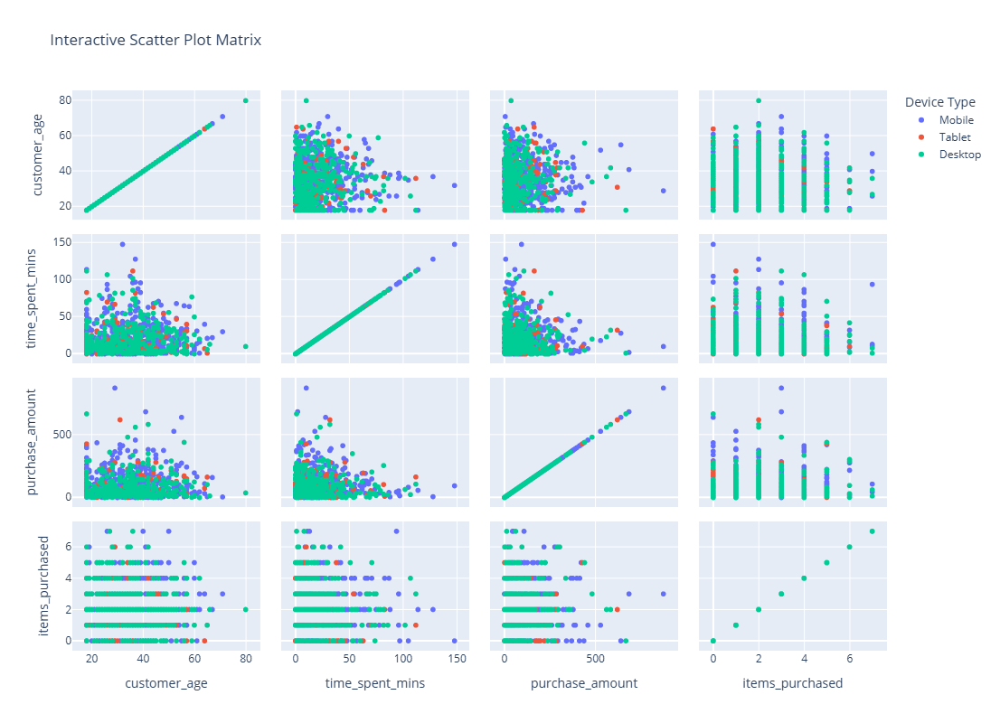

In [66]:
# Scatter plot matrix (SPLOM)
fig = px.scatter_matrix(
    ecommerce_df,  # Use the full dataframe
    dimensions=['customer_age', 'time_spent_mins', 'purchase_amount', 'items_purchased'],
    color='device',
    title='Interactive Scatter Plot Matrix'
)
fig.update_layout(
    height=800,
    width=800,
    legend_title='Device Type'
)
fig.show()

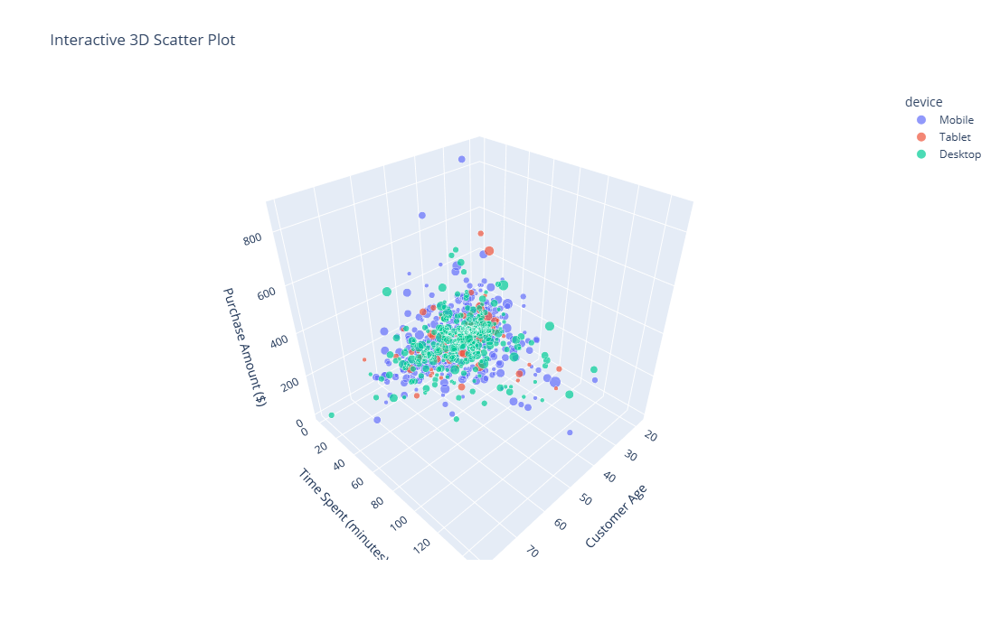

In [97]:
# Interactive 3D scatter plot
fig = px.scatter_3d(
    ecommerce_df,
    x='customer_age',
    y='time_spent_mins',
    z='purchase_amount',
    color='device',
    size='items_purchased',
    opacity=0.7,
    title='Interactive 3D Scatter Plot'
)

fig.update_layout(
    scene=dict(
        xaxis_title='Customer Age',
        yaxis_title='Time Spent (minutes)',
        zaxis_title='Purchase Amount ($)'
    ),
    height=700,
    width=900
)

fig.show()

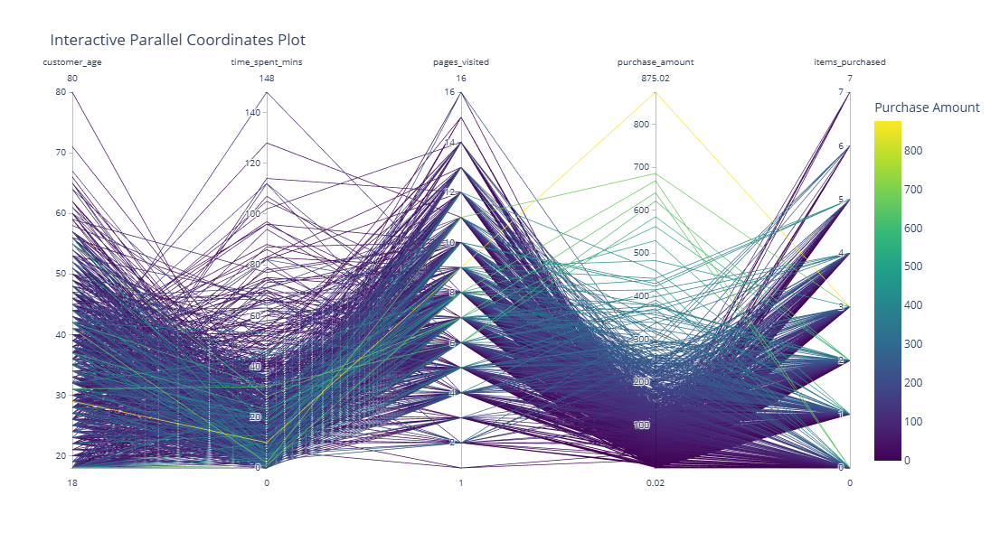

In [98]:
# Interactive parallel coordinates plot
fig = px.parallel_coordinates(
    ecommerce_df,
    dimensions=['customer_age', 'time_spent_mins', 'pages_visited', 
                'purchase_amount', 'items_purchased'],
    color='purchase_amount',
    color_continuous_scale='Viridis',
    title='Interactive Parallel Coordinates Plot'
)

fig.update_layout(
    coloraxis_colorbar=dict(title='Purchase Amount'),
    height=600,
    width=1000
)

fig.show()

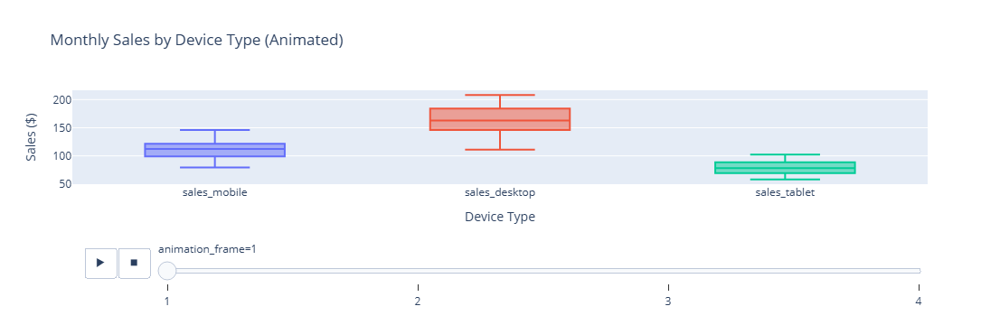

In [99]:
# Interactive categorical plot with animation
fig = px.box(
    time_series_long,
    x='device',
    y='sales',
    color='device',
    animation_frame=time_series_long['date'].dt.month,
    animation_group='device',
    title='Monthly Sales by Device Type (Animated)'
)

fig.update_layout(
    xaxis_title='Device Type',
    yaxis_title='Sales ($)',
    showlegend=False
)

fig.show()

### Dashboards with Plotly

Creating more complex dashboards by combining multiple Plotly visualizations:

In [100]:
# Import Plotly graph objects and subplots
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a dashboard with multiple plots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Purchase Amount by Device', 'Time Spent Distribution',
                   'Conversion Rate by Device', 'Purchase vs. Time Spent'),
    specs=[[{'type': 'bar'}, {'type': 'histogram'}],
           [{'type': 'pie'}, {'type': 'scatter'}]]
)

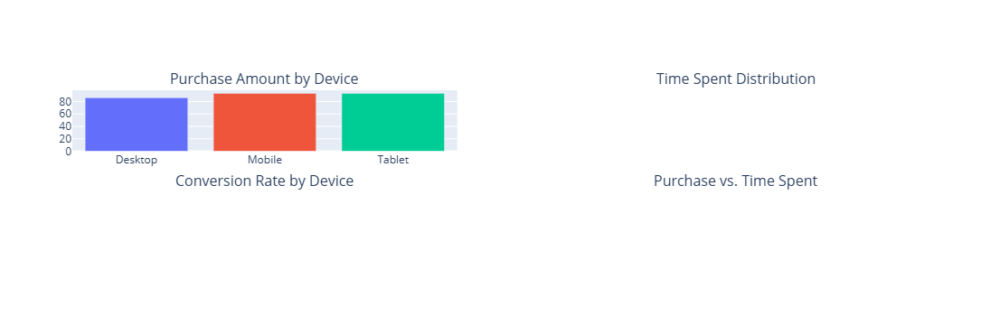

In [101]:
# 1. Bar chart of average purchase by device
device_avg = ecommerce_df.groupby('device')['purchase_amount'].mean().reset_index()
fig.add_trace(
    go.Bar(
        x=device_avg['device'],
        y=device_avg['purchase_amount'],
        marker_color=['#636EFA', '#EF553B', '#00CC96'],
        showlegend=False
    ),
    row=1, col=1
)

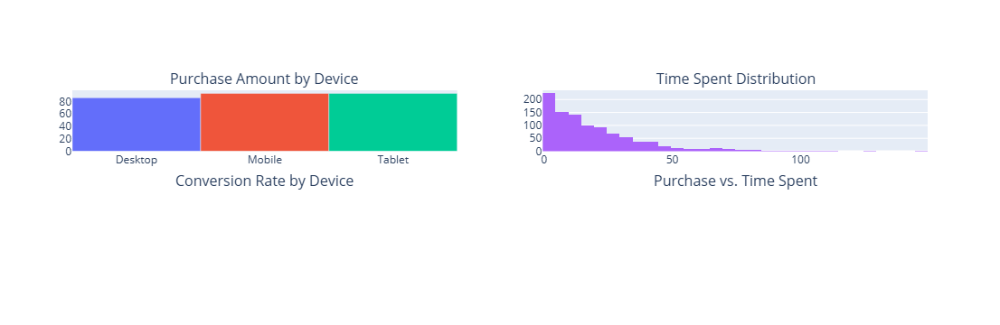

In [102]:
# 2. Histogram of time spent
fig.add_trace(
    go.Histogram(
        x=ecommerce_df['time_spent_mins'],
        nbinsx=30,
        marker_color='#AB63FA',
        showlegend=False
    ),
    row=1, col=2
)

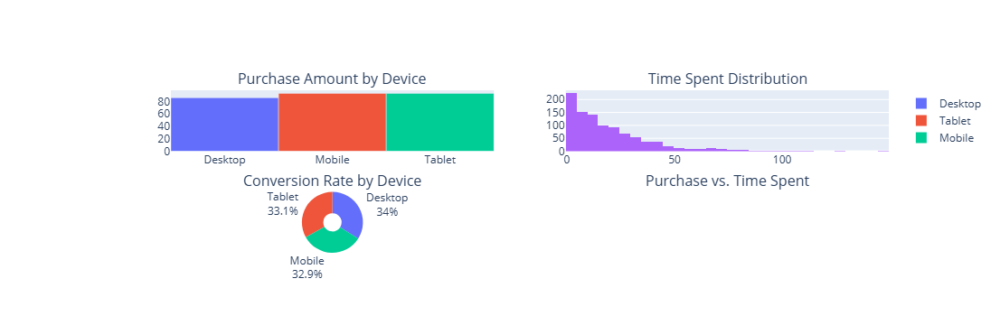

In [103]:
# 3. Pie chart of conversion rate by device
conversion_by_device = ecommerce_df.groupby('device')['conversion'].mean().reset_index()
fig.add_trace(
    go.Pie(
        labels=conversion_by_device['device'],
        values=conversion_by_device['conversion'],
        textinfo='label+percent',
        hole=0.3
    ),
    row=2, col=1
)

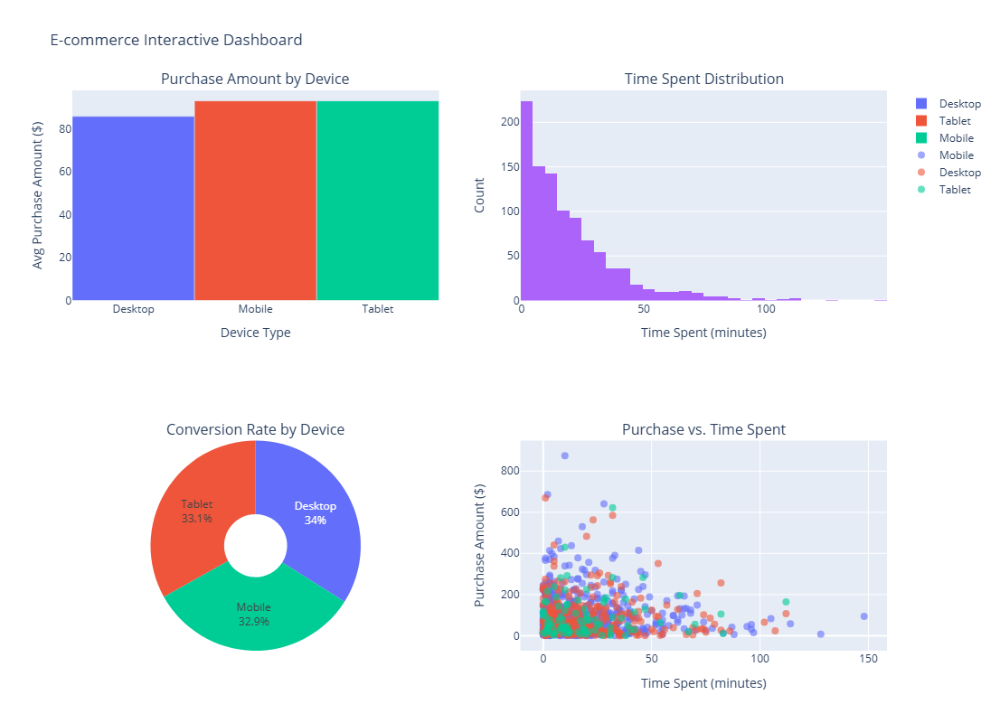

In [104]:
# 4. Scatter plot of purchase vs. time spent
for device, color in zip(['Mobile', 'Desktop', 'Tablet'], ['#636EFA', '#EF553B', '#00CC96']):
    subset = ecommerce_df[ecommerce_df['device'] == device]
    fig.add_trace(
        go.Scatter(
            x=subset['time_spent_mins'],
            y=subset['purchase_amount'],
            mode='markers',
            marker=dict(size=8, opacity=0.6, color=color),
            name=device
        ),
        row=2, col=2
    )

# Update layout
fig.update_layout(
    title_text='E-commerce Interactive Dashboard',
    height=800,
    width=1200
)

# Update axes labels
fig.update_xaxes(title_text='Device Type', row=1, col=1)
fig.update_yaxes(title_text='Avg Purchase Amount ($)', row=1, col=1)

fig.update_xaxes(title_text='Time Spent (minutes)', row=1, col=2)
fig.update_yaxes(title_text='Count', row=1, col=2)

fig.update_xaxes(title_text='Time Spent (minutes)', row=2, col=2)
fig.update_yaxes(title_text='Purchase Amount ($)', row=2, col=2)

fig.show()

### Exercises: Interactive Visualizations

**Exercise 1**: Create an interactive scatter plot of the iris dataset using Plotly Express, showing sepal length vs. sepal width, with points colored by species and sized by petal length.

**Exercise 2**: Generate an interactive bar chart showing the top 5 features in the wine dataset with the highest correlation to wine class.

**Exercise 3**: Build a simple dashboard using Plotly's make_subplots that includes:
- A histogram of petal length from the iris dataset
- A box plot comparing sepal width across species
- A scatter plot of petal length vs. petal width

## Comprehensive Project

**Final Project**: Create a comprehensive analysis of the diabetes dataset using advanced visualization techniques. Your analysis should include:

1. Statistical visualizations showing the distribution of key features
2. Seaborn plots exploring relationships between features
3. Correlation analysis using heatmaps
4. A pair plot or joint plot showing relationships between selected variables
5. At least one interactive Plotly visualization

Provide interpretations of each visualization and insights derived from the analysis. Discuss how these visualizations could help in predicting diabetes progression.

## Summary

This module has covered a wide range of advanced visualization techniques for exploring and communicating complex data relationships:

1. **Statistical Visualizations**
   - Histograms for understanding distributions
   - Box plots for comparing groups and identifying outliers
   - Violin plots for detailed distribution visualization
   - KDE plots for smooth distribution estimates

2. **Seaborn for Statistical Graphics**
   - Styling and themes to enhance visualizations
   - Categorical plots for comparing groups
   - Relational plots for exploring relationships

3. **Multivariate Visualization**
   - Pair plots for exploring multiple variable relationships
   - Joint plots for detailed bivariate analysis
   - Facet grids for complex multi-variable visualization

4. **Correlation Analysis with Heatmaps**
   - Basic correlation heatmaps
   - Clustered heatmaps for pattern identification
   - Annotated heatmaps for enhanced interpretation

5. **Interactive Visualization with Plotly**
   - Basic interactive plots
   - Enhanced interactivity features
   - Creating dashboards with multiple plots

These techniques enable data scientists to:
- Extract deeper insights from complex datasets
- Identify patterns, correlations, and outliers more effectively
- Communicate findings more clearly
- Create more engaging and interactive visualizations

Mastering these advanced visualization techniques will significantly enhance your data analysis capabilities and help you communicate your insights more effectively to both technical and non-technical audiences.

## Further Resources

To continue developing your data visualization skills:

### Books
- "Python for Data Analysis" by Wes McKinney
- "Interactive Data Visualization with Python" by Abha Belorkar and Sharath Chandra Guntuku
- "Fundamentals of Data Visualization" by Claus O. Wilke

### Online Resources
- [Seaborn Gallery](https://seaborn.pydata.org/examples/index.html)
- [Plotly Python Documentation](https://plotly.com/python/)
- [Data Visualization Society](https://www.datavisualizationsociety.com/)
- [Observable](https://observablehq.com/) - For inspiration and examples

### Python Libraries
- **Matplotlib**: The foundation for visualization in Python
- **Seaborn**: Statistical visualization built on Matplotlib
- **Plotly**: Interactive visualizations
- **Bokeh**: Interactive web visualizations
- **Altair**: Declarative visualization with a grammar of graphics approach
- **Dash**: Build web-based dashboards with Plotly